# 환경설정

## 1. Kaggle 설정 및 데이터 다운로드

### 1.1. Colab 설정

In [ ]:
# Colab
# kaggle api update
!pip install --upgrade --force-reinstall --no-deps kaggle

# kaggle api token upload
# 셀 실행 후 api token이 포함된 kaggle.json 파일 업로드 필요
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

### 1.2. Mac/Linux 설정

In [ ]:
# kaggle 파일 위치 이동 필요 (~/.kaggle/kaggle.json)

# 파일 권한 부여
# !chmod 600 ~/.kaggle/kaggle.json

# kaggle 라이브러리 설치
# !pip install kaggle

### 1.3. 데이터 다운로드

In [ ]:
!kaggle competitions download -c costa-rican-household-poverty-prediction

  0% 0.00/2.33M [00:00<?, ?B/s]
100% 2.33M/2.33M [00:00<00:00, 169MB/s]


In [1]:
!unzip 'costa-rican-household-poverty-prediction.zip'

Archive:  costa-rican-household-poverty-prediction.zip
  inflating: codebook.csv            
  inflating: codebook.xlsx           
  inflating: sample_submission.csv   
  inflating: sample_submission.csv.zip  
  inflating: test.csv                
  inflating: test.csv.zip            
  inflating: train.csv               
  inflating: train.csv.zip           


## 2. 추가 라이브러리 다운로드

In [ ]:
# colab은 설치 후 커널 재시작 필요
# !pip install shap
# !pip install featuretools

     |████████████████████████████████| 358kB 5.1MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491624 sha256=a7b71d61d70185c1aed6c1a80ed864923eb670ed418b35339035efc5df6b6f96
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap
     |████████████████████████████████| 307kB 5.0MB/s 
     |████████████████████████████████| 10.8MB 31.3MB/s 
     |████████████████████████████████| 645kB 38.8MB/s 
     |████████████████████████████████| 296kB 55.9MB/s 
     |████████████████████████████████| 727kB 33.9MB/s 
     |████████████████████████████████| 122kB 52.8MB/s 
ERROR: google-colab 1.0.0 has requirement pandas~=1.1.0; python_version >= "3.0", but you'll have pandas 1.3.0 which is incompatible.
ERROR: distributed 2021.6.2 has requirement cloudpickle>=1.5.0, but you'll have cloudpickle 1.3.0 which is incompatible.
ERROR: distributed 2021.6.2 has requirement dask==2021.06.2, but

In [ ]:
# xgboost, lightgbm 설치 참조 (Mac 오류 발생 시)
# colab 은 기본으로 설치되어있음
# docker로 리눅스 띄워서 하는 것도 방법
# !brew install libomp  # gcc 오류 해결 해줌
# !pip install lightgbm
# !pip install xgboost

로컬에서 라이브러리 설치가 되어있고 데이터가 다운되어있다면 위 과정 불필요

## 3. 필요 라이브러리 import

In [3]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

sns.set(font_scale=2.2)
plt.style.use('seaborn')

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.model_selection import StratifiedKFold, train_test_split, ShuffleSplit
from sklearn.metrics import f1_score
import itertools
import lightgbm as lgb
import xgboost as xgb
from xgboost import XGBClassifier
import shap
from tqdm import tqdm
import featuretools as ft
import warnings
warnings.filterwarnings('ignore')
import time

# 분석

**경로 설정**

In [1]:
data_path = "./data/"
result_path = "./result/"

## 1. EDA

In [22]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
plt.style.use('fivethirtyeight') # plt.style.available 로 가능한 스타일 확인 가능, 그 중 하나 이 라인처럼 선택해서 사용
# rc(runtime configuration) 설정. 한 번 설정해놓으면 매번 그릴 때마다 할 필요 없음 
plt.rcParams['font.size'] = 18
plt.rcParams['patch.edgecolor'] = 'k'

# plt.rcParams["figure.figsize"] = (14,4)
# plt.rcParams['lines.linewidth'] = 2
# plt.rcParams['lines.color'] = 'r'
# plt.rcParams['axes.grid'] = True 

pd.options.display.max_columns = 150 # 표시되는 max cols 갯수 설정

In [4]:
train = pd.read_csv(data_path + "train.csv")
test = pd.read_csv(data_path + "test.csv")
train.head()

,Id,v2a1,hacdor,rooms,hacapo,v14a,refrig,v18q,v18q1,r4h1,...,SQBescolari,SQBage,SQBhogar_total,SQBedjefe,SQBhogar_nin,SQBovercrowding,SQBdependency,SQBmeaned,agesq,Target
0,ID_279628684,190000.0,0,3,0,1,1,0,NaN,0,...,100,1849,1,100,0,1.000000,0.0,100.0,1849,4
1,ID_f29eb3ddd,135000.0,0,4,0,1,1,1,1.0,0,...,144,4489,1,144,0,1.000000,64.0,144.0,4489,4
2,ID_68de51c94,NaN,0,8,0,1,1,0,NaN,0,...,121,8464,1,0,0,0.250000,64.0,121.0,8464,4
3,ID_d671db89c,180000.0,0,5,0,1,1,1,1.0,0,...,81,289,16,121,4,1.777778,1.0,121.0,289,4
4,ID_d56d6f5f5,180000.0,0,5,0,1,1,1,1.0,0,...,121,1369,16,121,4,1.777778,1.0,121.0,1369,4


In [26]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9557 entries, 0 to 9556
Columns: 143 entries, Id to Target
dtypes: float64(8), int64(130), object(5)
memory usage: 10.4+ MB


In [27]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23856 entries, 0 to 23855
Columns: 142 entries, Id to agesq
dtypes: float64(8), int64(129), object(5)
memory usage: 25.8+ MB


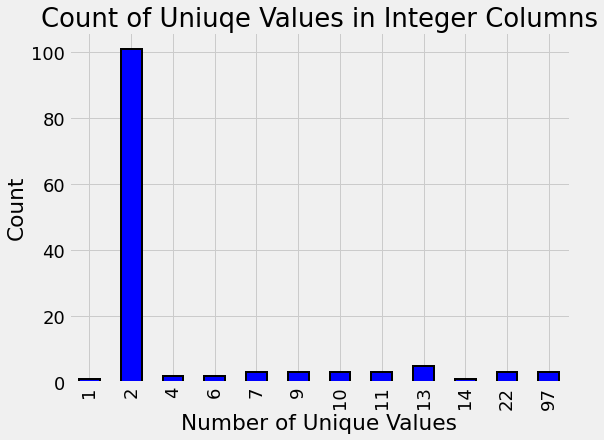

In [38]:
train.select_dtypes(np.int64).nunique().value_counts().sort_index().plot.bar(color='blue',
                                                                             figsize = (8, 6),
                                                                             edgecolor='k', linewidth=2) # k는 black의 약자
plt.xlabel('Number of Unique Values')
plt.ylabel('Count')
plt.title('Count of Uniuqe Values in Integer Columns')
plt.show()

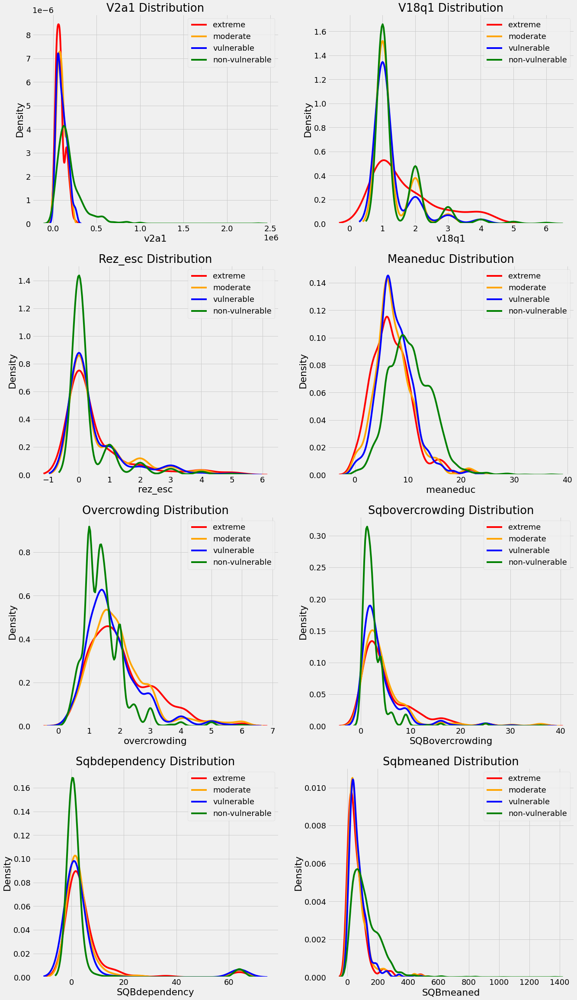

In [62]:
from collections import OrderedDict

plt.figure(figsize=(20, 16))

colors = OrderedDict({1: 'red', 2: 'orange', 3: 'blue', 4: 'green'})
poverty_mapping = OrderedDict({1: 'extreme', 2: 'moderate', 3: 'vulnerable', 4: 'non-vulnerable'})

for i, col in enumerate(train.select_dtypes('float')):
    # i > 0 이어야 됨
    ax = plt.subplot(4, 2, i+1) # 4행, 2열, 원하는 번째 plot
    for poverty_level, color in colors.items():
        sns.kdeplot(train.loc[train['Target'] == poverty_level, col].dropna(),
                   ax=ax, color=color, label=poverty_mapping[poverty_level])
        
    plt.title('%s Distribution' % col.capitalize())
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()

plt.subplots_adjust(top=2)

In [63]:
train.select_dtypes('object').head()

,Id,idhogar,dependency,edjefe,edjefa
0,ID_279628684,21eb7fcc1,no,10,no
1,ID_f29eb3ddd,0e5d7a658,8,12,no
2,ID_68de51c94,2c7317ea8,8,no,11
3,ID_d671db89c,2b58d945f,yes,11,no
4,ID_d56d6f5f5,2b58d945f,yes,11,no


In [64]:
mapping = {"yes": 1, "no": 0}

for df in [train, test]:
    df['dependency'] = df['dependency'].replace(mapping).astype(np.float64)
    df['edjefa'] = df['edjefa'].replace(mapping).astype(np.float64)
    df['edjefe'] = df['edjefe'].replace(mapping).astype(np.float64)
    
train[['dependency', 'edjefa', 'edjefe']].describe()

,dependency,edjefa,edjefe
count,9557.000000,9557.000000,9557.000000
mean,1.149550,2.896830,5.096788
std,1.605993,4.612056,5.246513
min,0.000000,0.000000,0.000000
25%,0.333333,0.000000,0.000000
50%,0.666667,0.000000,6.000000
75%,1.333333,6.000000,9.000000
max,8.000000,21.000000,21.000000


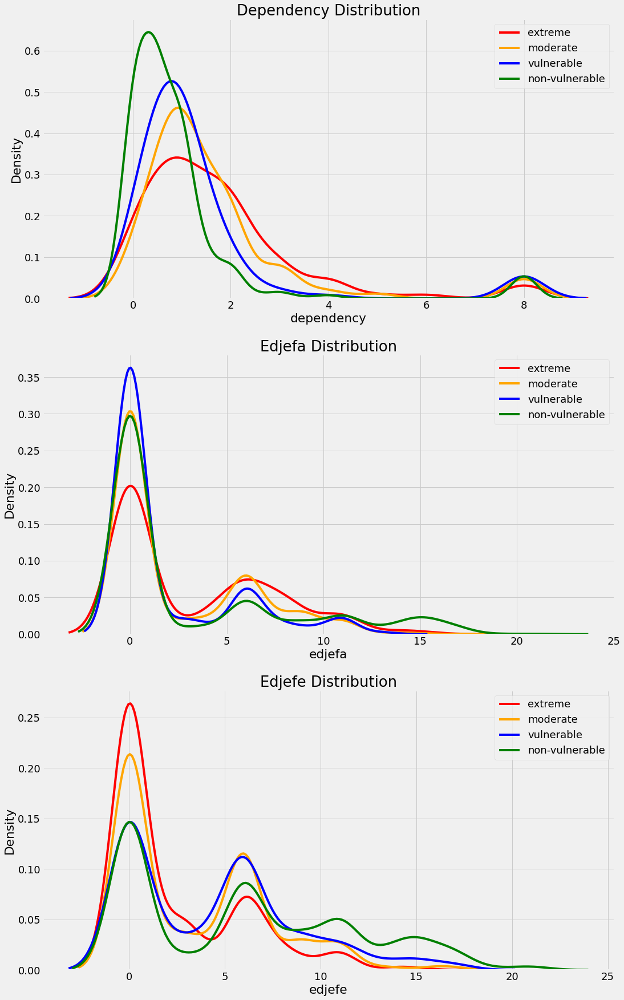

In [67]:
plt.figure(figsize=(16, 12))

for i, col in enumerate(['dependency', 'edjefa', 'edjefe']):
    ax = plt.subplot(3, 1, i+1)
    
    for poverty_level, color in colors.items():
        sns.kdeplot(train.loc[train['Target'] == poverty_level, col].dropna(),
                   ax=ax,
                   color=color,
                   label=poverty_mapping[poverty_level])
    
    plt.title('%s Distribution' % col.capitalize())
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    
plt.subplots_adjust(top=2)

In [68]:
test['Target'] = np.nan
# train, test 하나로 합쳐보기
data = train.append(test, ignore_index=True)

1.0     222
2.0     442
3.0     355
4.0    1954
Name: Target, dtype: int64

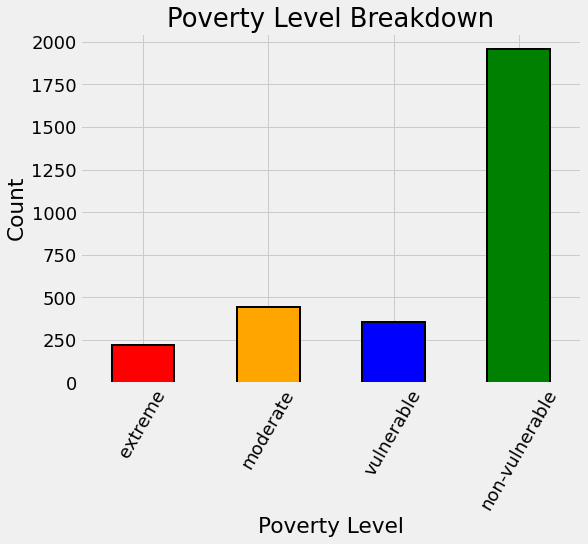

In [80]:
# exploring lable distribution
heads = data.loc[data['parentesco1'] == 1].copy()

train_labels = data.loc[(data['Target'].notnull()) & (data['parentesco1'] == 1), ['Target', 'idhogar']]

label_counts = train_labels['Target'].value_counts().sort_index()

label_counts.plot.bar(figsize=(8, 6),
                     color=colors.values(),
                     edgecolor='k', linewidth=2)

plt.xlabel('Poverty Level')
plt.ylabel('Count')
plt.xticks([x-1 for x in poverty_mapping.keys()],
          list(poverty_mapping.values()), rotation=60)
plt.title('Poverty Level Breakdown')

label_counts

In [97]:
all_equal = train.groupby('idhogar')['Target'].apply(lambda x: x.nunique() == 1)

not_equal = all_equal[all_equal != True]
print('There are %s households where the family members do not all have the same target' % len(not_equal))

There are 85 households where the family members do not all have the same target


In [102]:
train[train['idhogar'] == not_equal.index[0]][['idhogar', 'parentesco1', 'Target']]

,idhogar,parentesco1,Target
7651,0172ab1d9,0,3
7652,0172ab1d9,0,2
7653,0172ab1d9,0,3
7654,0172ab1d9,1,3
7655,0172ab1d9,0,2


In [109]:
households_leader = train.groupby('idhogar')['parentesco1'].sum()

households_no_head = train.loc[train['idhogar'].isin(households_leader[households_leader == 0].index), :]

print('There are %s households without a head' % households_no_head['idhogar'].nunique())

There are 15 households without a head


In [110]:
households_no_head_equal = households_no_head.groupby('idhogar')['Target'].apply(lambda x: x.nunique() == 1)
print('%s Households with no head have different labels' % sum(households_no_head_equal == False))

0 Households with no head have different labels


In [116]:
for household in not_equal.index:
    true_target = int(train[(train['idhogar'] == household) & (train['parentesco1'] == 1.0)]['Target'])
    
    train.loc[train['idhogar'] == household, 'Target'] = true_target

all_equal = train.groupby('idhogar')['Target'].apply(lambda x: x.nunique() == 1)

not_equal = all_equal[all_equal != True]
print('There are %s households where the family members do not all have the same target' % len(not_equal))

There are 0 households where the family members do not all have the same target


### Missing Variables

In [121]:
missing = pd.DataFrame(data.isnull().sum()).rename(columns={0: 'total'})

missing['percent'] = missing['total'] / len(data)

missing.sort_values('percent', ascending=False).head(10).drop('Target')

,total,percent
rez_esc,27581,0.825457
v18q1,25468,0.762218
v2a1,24263,0.726154
SQBmeaned,36,0.001077
meaneduc,36,0.001077
hogar_adul,0,0.000000
parentesco10,0,0.000000
parentesco11,0,0.000000
parentesco12,0,0.000000


In [122]:
def plot_value_counts(df, col, heads_only=False):
    if heads_only:
        df = df.loc[df['parentesco1'] == 1].copy()
    
    plt.figure(figsize=(8, 6))
    df[col].value_counts().sort_index().plot.bar(color='blue',
                                                edgecolor='k',
                                                linewidth=2)
    plt.xlabel(col)
    plt.title('%s Value Counts' % col)
    plt.ylabel('Count')
    plt.show()

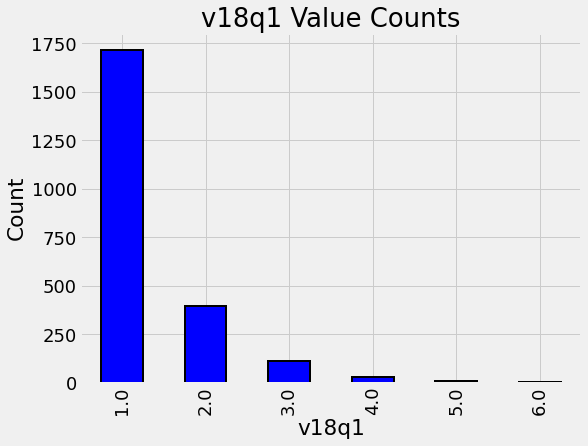

In [130]:
plot_value_counts(heads, 'v18q1')

In [132]:
heads.groupby('v18q')['v18q1'].apply(lambda x: x.isnull().sum())  # v18q1이 null로 나온 모든 사람들이 tablet이 없음 (v18q = 0)

v18q
0    8044
1       0
Name: v18q1, dtype: int64

In [138]:
data['v18q1'] = data['v18q1'].fillna(0)

Text(0.5, 1.0, 'Home Ownership Status for Households Missing Rent Payments')

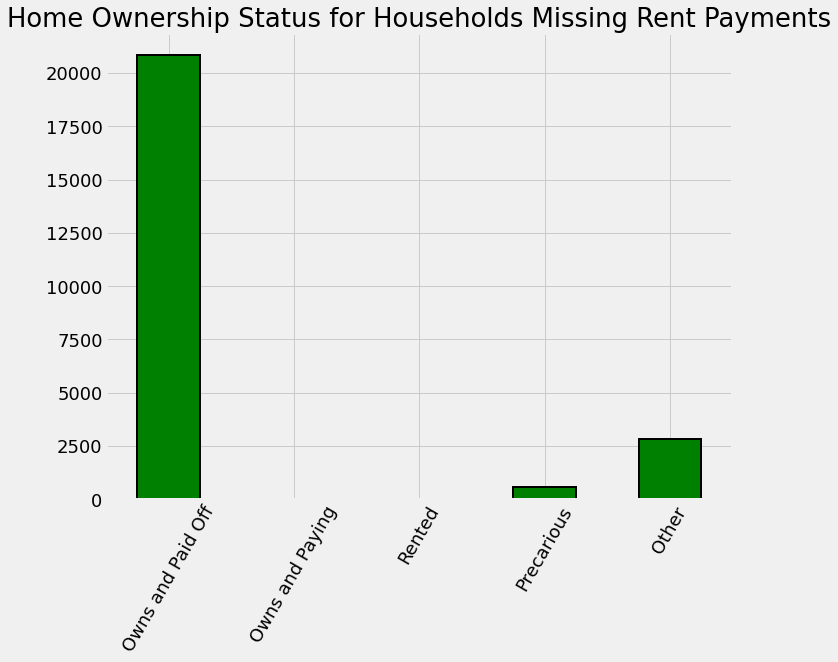

In [141]:
own_variables = [x for x in data if x.startswith('tipo')]

data.loc[data['v2a1'].isnull(), own_variables].sum().plot.bar(figsize=(10, 8),
                                                             color='green',
                                                             edgecolor='k',
                                                             linewidth=2)

plt.xticks([0, 1, 2, 3, 4],
          ['Owns and Paid Off', 'Owns and Paying', 'Rented', 'Precarious', 'Other'],
          rotation=60)
plt.title('Home Ownership Status for Households Missing Rent Payments')

In [144]:
data.loc[(data['tipovivi1'] == 1), 'v2a1'] = 0

data['v2a1-missing'] = data['v2a1'].isnull()

data['v2a1-missing'].value_counts()

False    29994
True      3419
Name: v2a1-missing, dtype: int64

In [148]:
data.loc[data['rez_esc'].notnull()]['age'].describe()

count    5832.000000
mean       12.185700
std         3.198618
min         7.000000
25%         9.000000
50%        12.000000
75%        15.000000
max        17.000000
Name: age, dtype: float64

In [149]:
data.loc[data['rez_esc'].isnull()]['age'].describe()

count    27581.000000
mean        39.110656
std         20.983114
min          0.000000
25%         24.000000
50%         38.000000
75%         54.000000
max         97.000000
Name: age, dtype: float64

In [150]:
data.loc[((data['age'] > 19) | (data['age'] < 7)) & (data['rez_esc'].isnull()), 'rez_esc'] = 0

# 어떻게 채워야 할 지 모르겠는 나머지는 일단 컬럼 만들어서 체크 하나 해 놓기
data['rez_esc-missing'] = data['rez_esc'].isnull()

In [151]:
# 대회 설명에 나와있는 규정에 넘어서는 outlier 제거
data.loc[data['rez_esc'] > 5, 'rez_esc'] = 5

**Plot Two Categorical Variables**

In [241]:
def plot_categoricals(x, y, data, annotate=True):
    raw_counts = pd.DataFrame(data.groupby(y)[x].value_counts(normalize=False))
    
    raw_counts = raw_counts.rename(columns={x: 'raw_count'})
    
    # relative frequency로 나타낸 카운트
    counts = pd.DataFrame(data.groupby(y)[x].value_counts(normalize=True))
    
    counts = counts.rename(columns={x: 'normalized_count'}).reset_index()
    counts['percent'] = 100 * counts['normalized_count']
    
    counts['raw_count'] = list(raw_counts['raw_count'])
        
    plt.figure(figsize=(14, 10))
    
    plt.scatter(counts[x], counts[y], edgecolor='k', color='lightgreen',
               s=100*np.sqrt(counts['raw_count']), marker='o', alpha=0.6, linewidth=1.5)
    
    if annotate:
        for i, row in counts.iterrows():
            # print(row[x], row[y], row[x] - (1 / counts[x].nunique()), row[y] - (0.15 / counts[y].nunique()))
            # 그냥 적절한 곳에 plotting 하기 위함
            plt.annotate(xy=(row[x] - (1 / counts[x].nunique()),
                             row[y] - (0.15 / counts[y].nunique())),
                             color='navy',
                             text=str(round(row['percent'], 1)) + "%")

    plt.yticks(counts[y].unique())
    plt.xticks(counts[x].unique())
    
    sqr_min = int(np.sqrt(raw_counts['raw_count'].min()))
    sqr_max = int(np.sqrt(raw_counts['raw_count'].max()))
    
    msizes = list(range(sqr_min, sqr_max,
                       int((sqr_max - sqr_min) / 5)))
    markers = []
    
    for size in msizes:
        # print('aa', int(round(np.square(size) / 100) * 100))
        markers.append(plt.scatter([], [], s=100*size,
                                  label=f"{int(round(np.square(size) / 100) * 100)}",
                                  color='lightgreen',
                                  alpha=0.6,
                                  edgecolor='k',
                                  linewidth=1.5))
    
    plt.legend(handles=markers, title='Counts',
              labelspacing=3, handletextpad=2,
              fontsize=16,
              loc=(1.10, 0.19)) # figure box가 (0,0)에서 (1,1)에 위치한다 생각하고 조절
    
    plt.annotate(f'* Size represents raw count while % is for a given y value.',
                xy=(0, 1), xycoords='figure points', size=10)
    
    plt.xlim((counts[x].min() - (6 / counts[x].nunique()),
             counts[x].max() + (6 / counts[x].nunique())))
    plt.ylim((counts[y].min() - (6 / counts[y].nunique()),
             counts[y].max() + (6 / counts[y].nunique())))
    
    plt.grid(None)
    
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f"{y} vs {x}")

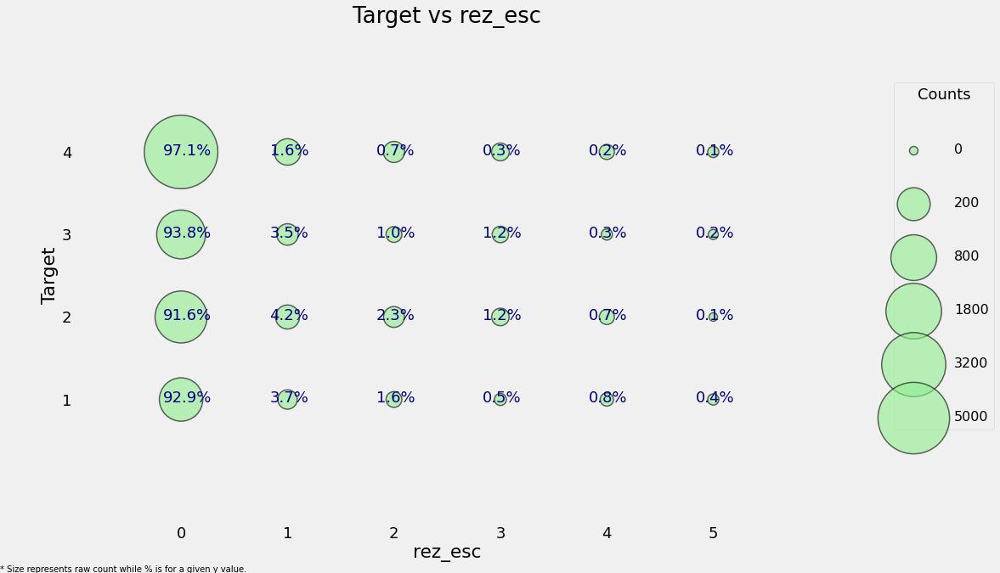

In [242]:
plot_categoricals('rez_esc', 'Target', data)

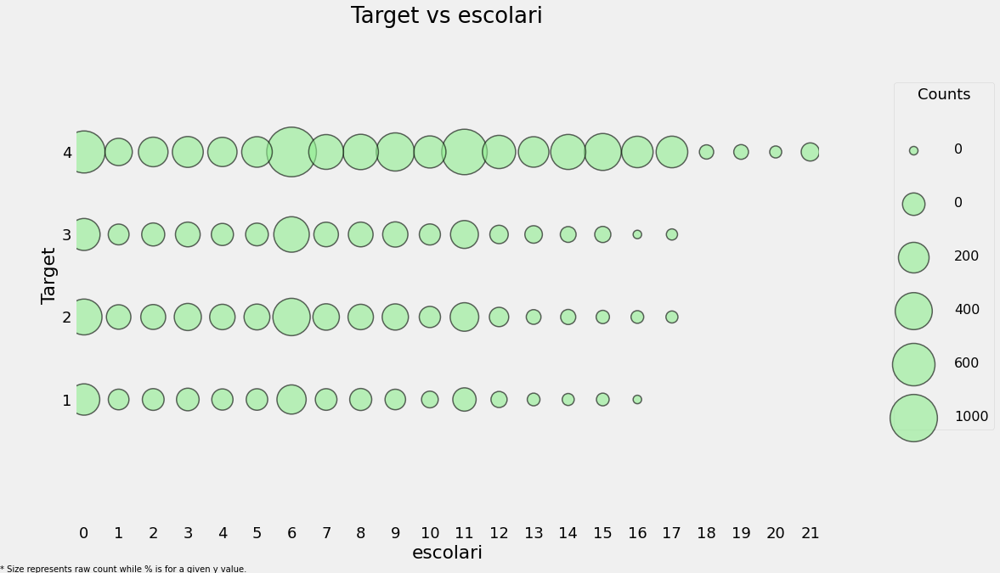

In [243]:
plot_categoricals('escolari', 'Target', data, annotate=False)

**Imputation**

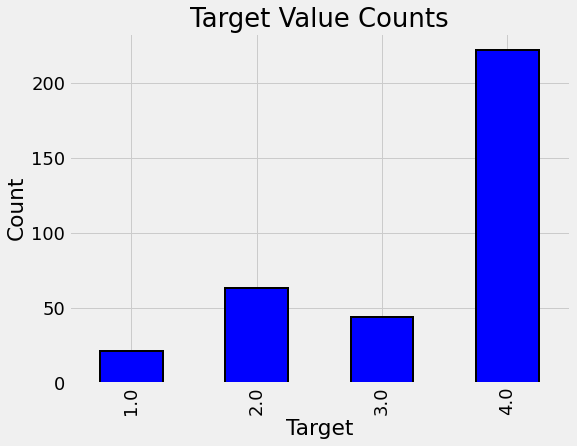

In [244]:
plot_value_counts(data[(data['rez_esc-missing'] == 1)],
                 'Target')

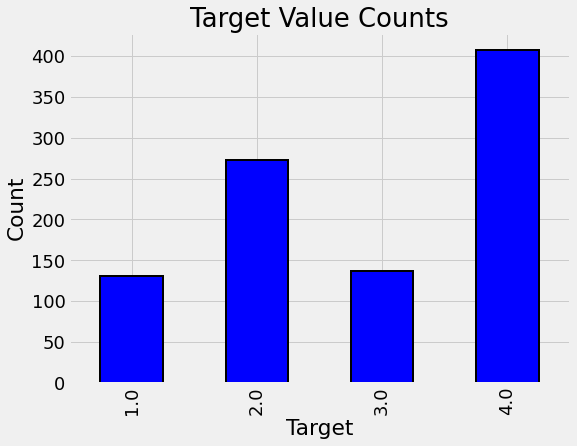

In [245]:
plot_value_counts(data[(data['v2a1-missing'] == 1)],
                 'Target')

**Feature Engineering**

In [246]:
id_ = ['Id', 'idhogar', 'Target']

In [247]:
ind_bool = ['v18q', 'dis', 'male', 'female', 'estadocivil1', 'estadocivil2', 'estadocivil3', 
            'estadocivil4', 'estadocivil5', 'estadocivil6', 'estadocivil7', 
            'parentesco1', 'parentesco2',  'parentesco3', 'parentesco4', 'parentesco5', 
            'parentesco6', 'parentesco7', 'parentesco8',  'parentesco9', 'parentesco10', 
            'parentesco11', 'parentesco12', 'instlevel1', 'instlevel2', 'instlevel3', 
            'instlevel4', 'instlevel5', 'instlevel6', 'instlevel7', 'instlevel8', 
            'instlevel9', 'mobilephone', 'rez_esc-missing']

ind_ordered = ['rez_esc', 'escolari', 'age']

In [248]:
hh_bool = ['hacdor', 'hacapo', 'v14a', 'refrig', 'paredblolad', 'paredzocalo', 
           'paredpreb','pisocemento', 'pareddes', 'paredmad',
           'paredzinc', 'paredfibras', 'paredother', 'pisomoscer', 'pisoother', 
           'pisonatur', 'pisonotiene', 'pisomadera',
           'techozinc', 'techoentrepiso', 'techocane', 'techootro', 'cielorazo', 
           'abastaguadentro', 'abastaguafuera', 'abastaguano',
            'public', 'planpri', 'noelec', 'coopele', 'sanitario1', 
           'sanitario2', 'sanitario3', 'sanitario5',   'sanitario6',
           'energcocinar1', 'energcocinar2', 'energcocinar3', 'energcocinar4', 
           'elimbasu1', 'elimbasu2', 'elimbasu3', 'elimbasu4', 
           'elimbasu5', 'elimbasu6', 'epared1', 'epared2', 'epared3',
           'etecho1', 'etecho2', 'etecho3', 'eviv1', 'eviv2', 'eviv3', 
           'tipovivi1', 'tipovivi2', 'tipovivi3', 'tipovivi4', 'tipovivi5', 
           'computer', 'television', 'lugar1', 'lugar2', 'lugar3',
           'lugar4', 'lugar5', 'lugar6', 'area1', 'area2', 'v2a1-missing']

hh_ordered = ['rooms', 'r4h1', 'r4h2', 'r4h3', 'r4m1','r4m2','r4m3', 'r4t1',  'r4t2', 
              'r4t3', 'v18q1', 'tamhog','tamviv','hhsize','hogar_nin',
              'hogar_adul','hogar_mayor','hogar_total',  'bedrooms', 'qmobilephone']

hh_cont = ['v2a1', 'dependency', 'edjefe', 'edjefa', 'meaneduc', 'overcrowding']

In [249]:
sqr_ = ['SQBescolari', 'SQBage', 'SQBhogar_total', 'SQBedjefe', 
        'SQBhogar_nin', 'SQBovercrowding', 'SQBdependency', 'SQBmeaned', 'agesq']

In [251]:
x = ind_bool + ind_ordered + id_ + hh_bool + hh_ordered + hh_cont + sqr_

from collections import Counter

# np.all -> 모두가 맞아야 True
print('There are no repeats: ', np.all(np.array(list(Counter(x).values())) == 1))
print('We covered every variable: ', len(x) == data.shape[1])

There are no repeats:  True
We covered every variable:  True


Text(0.5, 1.0, 'Squared Age versus Age')

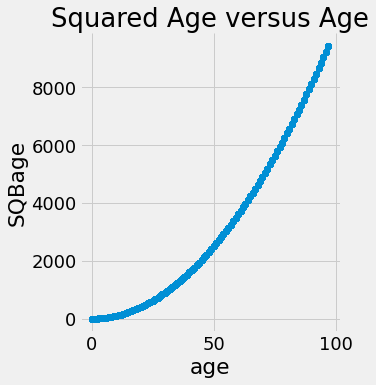

In [261]:
# squared variables는 linear 모델에서 유용할 수 있으나 이 케이스에서는 필요 없음
sns.lmplot(x='age', y='SQBage', data=data, fit_reg=False)
plt.title('Squared Age versus Age')

In [262]:
data = data.drop(columns=sqr_)
data.shape

(33413, 136)

In [264]:
heads = data.loc[data['parentesco1'] == 1, :]
heads = heads[id_ + hh_bool + hh_cont + hh_ordered]
heads.shape

(10307, 99)

In [266]:
corr_matrix = heads.corr()

# np.triu() -> correlation matrix 같은 표에서 대각선을 기준으로 한 쪽이 필요 없으니까 np.triu()로 상삼각 데이터만 남기게 함
# np.triu(np.ones(corr_matrix.shape), k=1).astype(bool) -> True, False 로 표시해야 될 부분만 where로 boolean으로 넘김
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.95)]

to_drop

['coopele', 'area2', 'tamhog', 'hhsize', 'hogar_total']

In [268]:
corr_matrix.loc[corr_matrix['tamhog'].abs() > 0.9, corr_matrix['tamhog'].abs() > 0.9]

,r4t3,tamhog,tamviv,hhsize,hogar_total
r4t3,1.000000,0.998287,0.910457,0.998287,0.998287
tamhog,0.998287,1.000000,0.909155,1.000000,1.000000
tamviv,0.910457,0.909155,1.000000,0.909155,0.909155
hhsize,0.998287,1.000000,0.909155,1.000000,1.000000
hogar_total,0.998287,1.000000,0.909155,1.000000,1.000000


<AxesSubplot:>

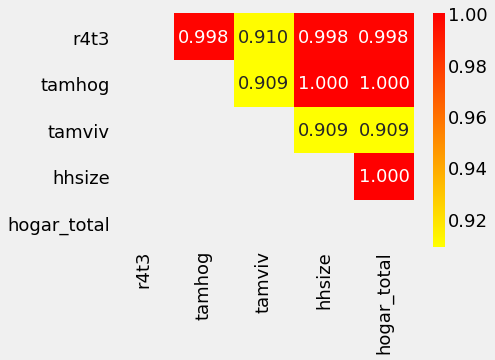

In [294]:
# loc[row_con,col_con] 
hh_corr = corr_matrix.loc[corr_matrix['tamhog'].abs() > 0.9, corr_matrix['tamhog'].abs() > 0.9]

sns.heatmap(hh_corr.where(np.triu(np.ones(hh_corr.shape), k=1).astype(bool)),
           annot=True, cmap=plt.cm.autumn_r, fmt='.3f')

In [295]:
heads = heads.drop(columns=['tamhog', 'hogar_total', 'r4t3'])

Text(0.5, 1.0, 'Household size vs Number of persons living in the household')

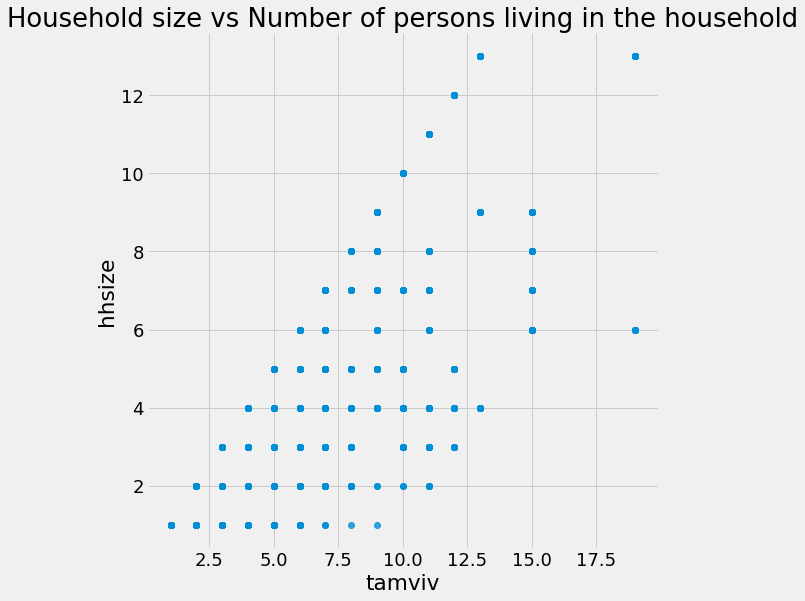

In [298]:
sns.lmplot('tamviv', 'hhsize', data, fit_reg=False, height=8)
plt.title('Household size vs Number of persons living in the household')

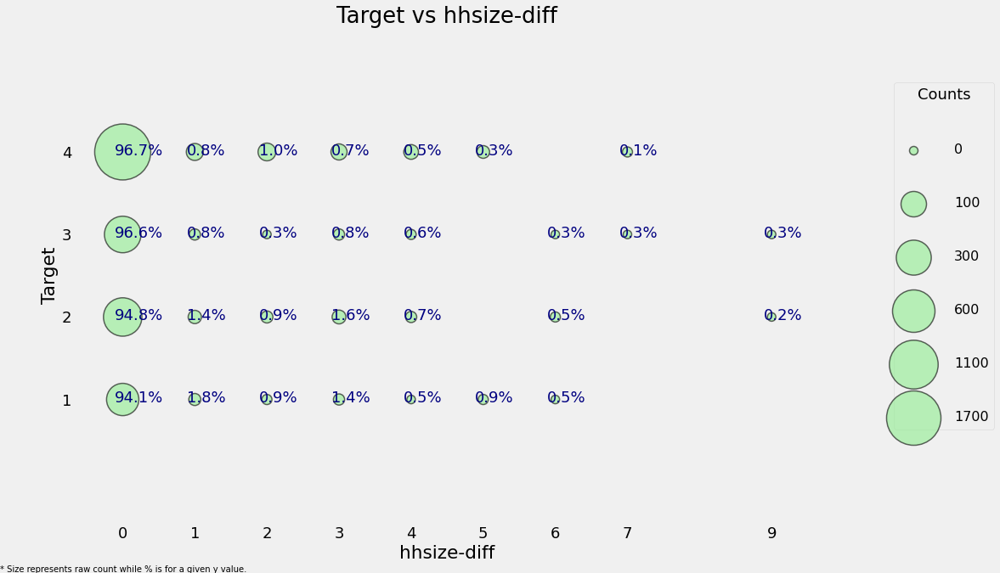

In [299]:
heads['hhsize-diff'] = heads['tamviv'] - heads['hhsize']
plot_categoricals('hhsize-diff', 'Target', heads)

In [300]:
corr_matrix.loc[corr_matrix['coopele'].abs() > 0.9, corr_matrix['coopele'].abs() > 0.9]

,public,coopele
public,1.000000,-0.967759
coopele,-0.967759,1.000000


In [304]:
heads[['noelec', 'coopele', 'public', 'planpri']]

,noelec,coopele,public,planpri
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0
5,0,0,1,0
8,0,0,1,0
...,...,...,...,...
33393,0,0,0,0
33398,0,1,0,0
33400,0,1,0,0
33404,0,1,0,0


**Create Ordinal Variables**

In [301]:
# 전기 관련 variable 4개 하나의 ordinal variable로 만들기
elec = []

for i, row in heads.iterrows():
    if row['noelec'] == 1:
        elec.append(0)
    elif row['coopele'] == 1:
        elec.append(1)
    elif row['public'] == 1:
        elec.append(2)
    elif row['planpri'] == 1:
        elec.append(3)
    else:
        elec.append(np.nan)

heads['elec'] = elec
heads['elec-missing'] = heads['elec'].isnull()

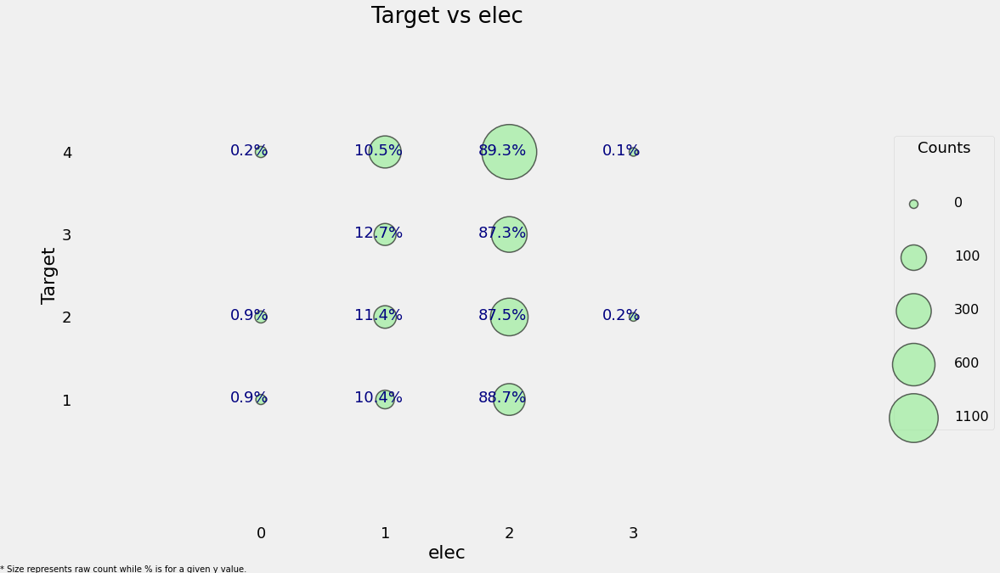

In [305]:
plot_categoricals('elec', 'Target', heads)

In [306]:
heads = heads.drop(columns='area2')  # area1 이 urban zone이냐 얘기하므로 area2인 rural zone이냐는 필요 없음
heads.groupby('area1')['Target'].value_counts(normalize=True)

area1  Target
0      4.0       0.582249
       2.0       0.176331
       3.0       0.147929
       1.0       0.093491
1      4.0       0.687030
       2.0       0.137688
       3.0       0.108083
       1.0       0.067199
Name: Target, dtype: float64

In [307]:
heads[['epared1', 'epared2', 'epared3']]

,epared1,epared2,epared3
0,0,1,0
1,0,1,0
2,0,1,0
5,0,0,1
8,1,0,0
...,...,...,...
33393,0,1,0
33398,1,0,0
33400,0,1,0
33404,1,0,0


In [311]:
heads['epared1'].unique()

array([0, 1])

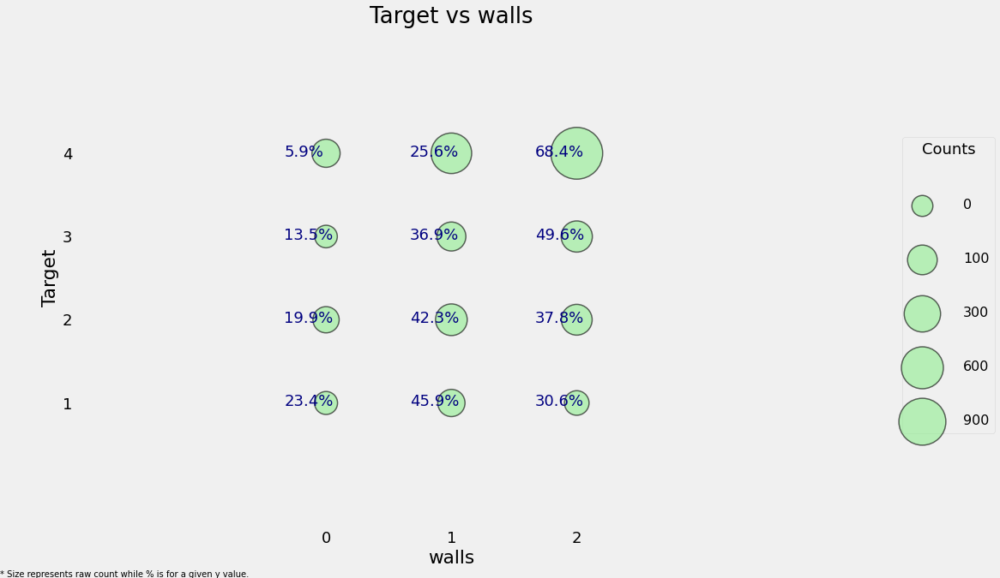

In [317]:
# axis=1 을 통해 열의 인덱스를 반환
heads['walls'] = np.argmax(np.array(heads[['epared1', 'epared2', 'epared3']]), axis=1)
plot_categoricals('walls', 'Target', heads)

In [318]:
heads['roof'] = np.argmax(np.array(heads[['etecho1', 'etecho2', 'etecho3']]), axis=1)

heads['floor'] = np.argmax(np.array(heads[['eviv1', 'eviv2', 'eviv3']]), axis=1)

In [319]:
# drop redundant values
heads = heads.drop(columns=['epared1', 'epared2', 'epared3', 'etecho1', 'etecho2', 'etecho3', 'eviv1', 'eviv2', 'eviv3'])

**Feature Construction**

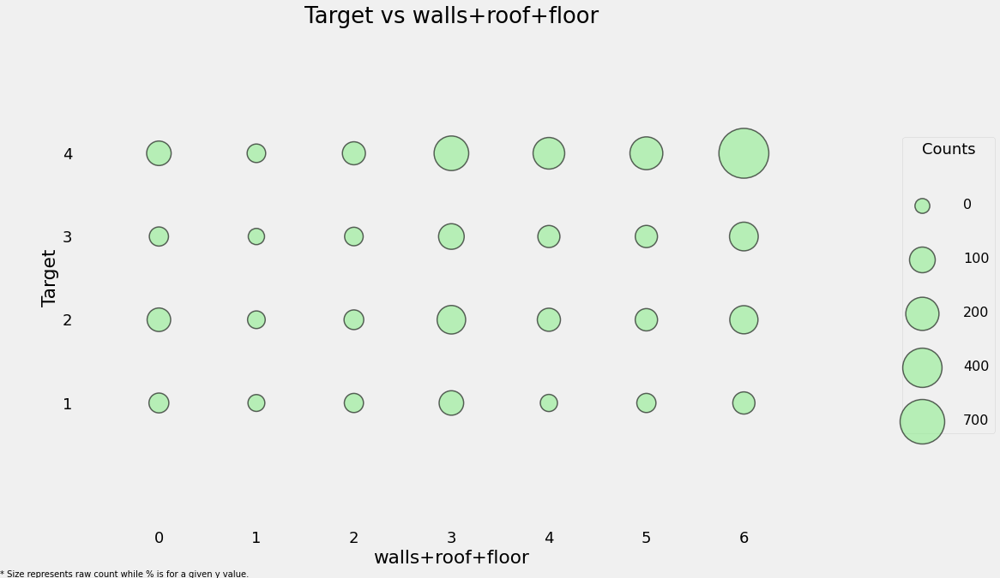

In [321]:
heads['walls+roof+floor'] = heads['walls'] + heads['roof'] + heads['floor']

plot_categoricals('walls+roof+floor', 'Target', heads, annotate=False)

In [322]:
counts = pd.DataFrame(heads.groupby(['walls+roof+floor'])['Target'].value_counts(normalize=True)).rename(columns={'Target': 'Normalized Count'}).reset_index()
counts.head()

,walls+roof+floor,Target,Normalized Count
0,0,4.0,0.376404
1,0,2.0,0.320225
2,0,1.0,0.162921
3,0,3.0,0.140449
4,1,4.0,0.323529


In [325]:
# 기초 인프라들이 없을 때마다 warning count 올리는 변수 생성
heads['warning'] = 1 * (heads['sanitario1'] +
                       (heads['elec'] == 0) +
                       heads['pisonotiene'] +
                       heads['abastaguano'] +
                       (heads['cielorazo'] == 0))

Text(0.5, 1.0, 'Target vs Warning Variables')

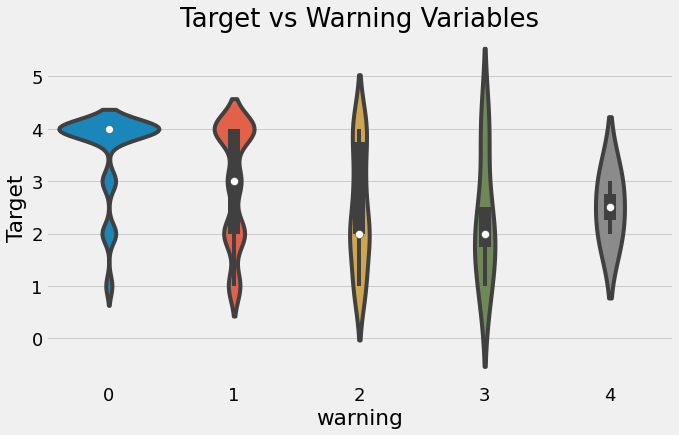

In [327]:
# violin plot이 위 plot과 결국 같은 역할
# 다만 연속형 변수처럼 target을 취급해 조금 결과가 이상하긴 하지만 대략적으로 보기에는 나쁘지 않음
plt.figure(figsize=(10, 6))
sns.violinplot(x='warning', y='Target', data=heads)
plt.title('Target vs Warning Variables')

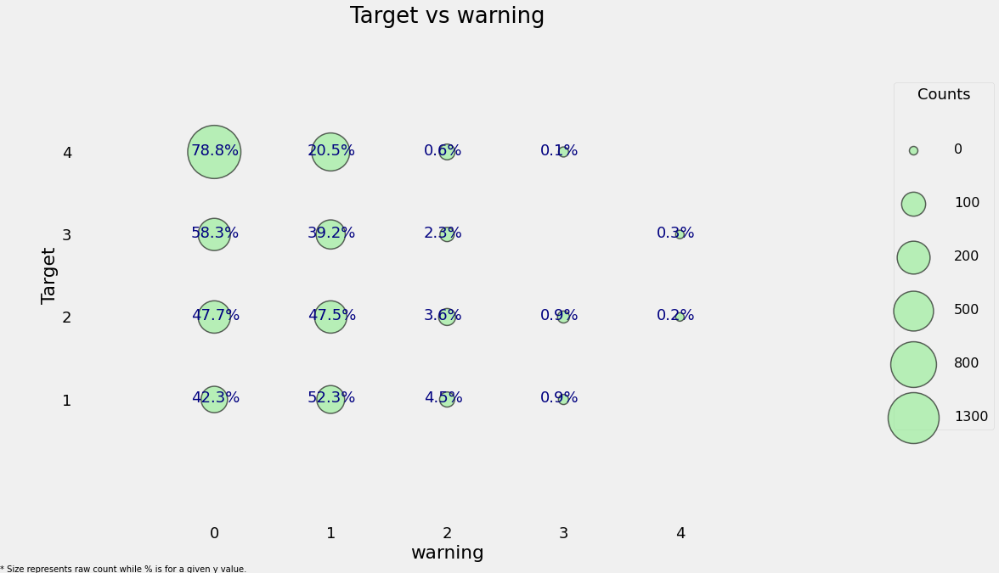

In [328]:
plot_categoricals('warning', 'Target', data=heads)

Text(0.5, 1.0, 'Target vs Bonus Variable')

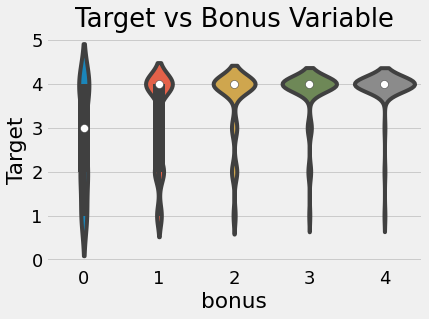

In [331]:
# bonus feature
heads['bonus'] = 1 * (heads['refrig'] +
                     heads['computer'] +
                     (heads['v18q1'] > 0) +
                     heads['television'])

sns.violinplot(x='bonus', y='Target', data=heads, figsize=(10, 6))
plt.title('Target vs Bonus Variable')

In [332]:
# per capita features
heads['phones-per-capita'] = heads['qmobilephone'] / heads['tamviv']
heads['tablets-per-capita'] = heads['v18q1'] / heads['tamviv']
heads['rooms-per-capita'] = heads['rooms'] / heads['tamviv']
heads['rent-per-capita'] = heads['v2a1'] / heads['tamviv']

In [334]:
# Pearson Correlation, Spearman Correlation 차이 비교
# Pearson은 선형만 잘 나타내고 Spearman은 비선형적이어도 오름과 내림을 잘 나타냄
from scipy.stats import spearmanr

In [335]:
def plot_corrs(x, y):
    spr = spearmanr(x, y).correlation
    pcr = np.corrcoef(x, y)[0, 1]
    
    data = pd.DataFrame({'x': x, 'y': y})
    plt.figure(figsize=(6, 4))
    sns.regplot('x', 'y', data=data, fit_reg=False)
    plt.title(f'Spearman: {round(spr, 2)}; Pearson: {round(pcr, 2)}')

/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


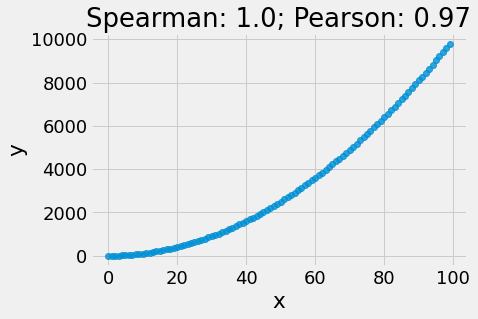

In [337]:
x = np.array(range(100))
y = x ** 2

plot_corrs(x, y)

결론적으로 현실의 데이터는 선형적이지 않은 경우가 많고 Pearson 과 Spearman correlation은 거의 대부분 값이 유사하게 나오나 Spearman이 상관도를 좀 더 잘 표현함

In [338]:
# Pearson
train_heads = heads.loc[heads['Target'].notnull(), :].copy()

pcorrs = pd.DataFrame(train_heads.corr()['Target'].sort_values()).rename(columns={'Target': 'pcorr'}).reset_index()
pcorrs = pcorrs.rename(columns={'index': 'feature'})

print('Most negatively correlated variables')
print(pcorrs.head())
print('')
print('Most positively correlated variables')
print(pcorrs.dropna().tail())

Most negatively correlated variables
        feature     pcorr
0       warning -0.301791
1     hogar_nin -0.266309
2          r4t1 -0.260917
3  overcrowding -0.234954
4          r4m1 -0.209479

Most positively correlated variables
              feature     pcorr
91  phones-per-capita  0.299026
92              floor  0.307605
93   walls+roof+floor  0.332446
94           meaneduc  0.333652
95             Target  1.000000


In [339]:
# Spearman
import warnings
warnings.filterwarnings('ignore', category=RuntimeWarning)

feats = []
scorr = []
pvalues = []

for c in heads:
    if heads[c].dtype != 'object':
        feats.append(c)
        scorr.append(spearmanr(train_heads[c], train_heads['Target']).correlation)
        pvalues.append(spearmanr(train_heads[c], train_heads['Target']).pvalue)

scorrs = pd.DataFrame({'feature': feats, 'scorr': scorr, 'pvalue': pvalues}).sort_values('scorr')

In [341]:
print('Most negative Spearman correlations:')
print(scorrs.head())
print('')
print('Most positive Spearman correlations:')
print(scorrs.dropna().tail())

Most negative Spearman correlations:
        feature     scorr        pvalue
91      warning -0.307326  4.682829e-66
62   dependency -0.281516  2.792620e-55
79    hogar_nin -0.236225  5.567218e-39
74         r4t1 -0.219226  1.112230e-33
8   pisocemento -0.209387  8.270816e-31

Most positive Spearman correlations:
              feature     scorr        pvalue
23          cielorazo  0.300996  2.611808e-63
89              floor  0.309638  4.466091e-67
93  phones-per-capita  0.337377  4.760104e-80
90   walls+roof+floor  0.338791  9.539346e-81
0              Target  1.000000  0.000000e+00


매우 유사하게 나옴. 다만, 차이가 나는 값들을 볼 필요가 있음

In [342]:
corrs = pcorrs.merge(scorrs, on='feature')
corrs['diff'] = corrs['pcorr'] - corrs['scorr']

corrs.sort_values('diff').head()

,feature,pcorr,scorr,pvalue,diff
73,rooms-per-capita,0.152185,0.223303,6.521453e-35,-0.071119
81,v18q1,0.197493,0.244200,1.282664e-41,-0.046708
83,tablets-per-capita,0.204638,0.248642,3.951568e-43,-0.044004
2,r4t1,-0.260917,-0.219226,1.112230e-33,-0.041691
91,phones-per-capita,0.299026,0.337377,4.760104e-80,-0.038351


In [343]:
corrs.sort_values('diff').dropna().tail()

,feature,pcorr,scorr,pvalue,diff
53,techozinc,0.014357,0.003404,8.528369e-01,0.010954
45,hogar_mayor,-0.025173,-0.041722,2.290994e-02,0.016549
84,edjefe,0.235687,0.214736,2.367521e-32,0.020951
62,edjefa,0.052310,0.005114,7.804715e-01,0.047197
13,dependency,-0.126465,-0.281516,2.792620e-55,0.155051


Text(0.5, 1.0, 'Target vs Dependency')

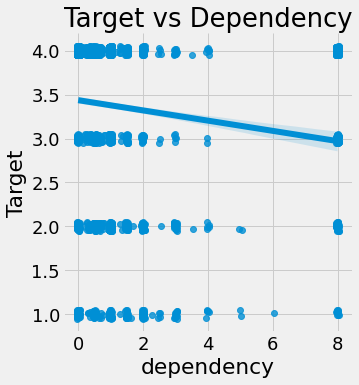

In [344]:
# 가장 차이 많이나는 dependency와 target 관계 그려보기
# jitter는 실제 값을 흔들어 중복된 값들을 좀 펼쳐서 보이게 함 (시각화 용도)
sns.lmplot(x='dependency', y='Target', fit_reg=True, data=train_heads, x_jitter=0.05, y_jitter=0.05)
plt.title('Target vs Dependency')

Text(0.5, 1.0, 'Target vs Roos Per Capita')

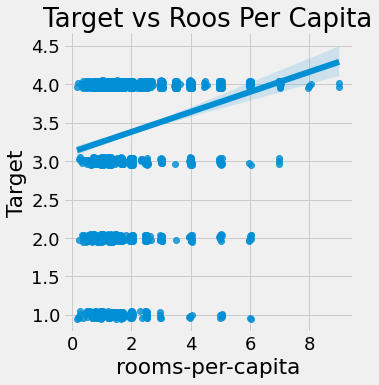

In [346]:
sns.lmplot(x='rooms-per-capita', y='Target', fit_reg=True, data=train_heads, x_jitter=0.05, y_jitter=0.05)
plt.title('Target vs Roos Per Capita')

**Correlation Heatmap**

<AxesSubplot:>

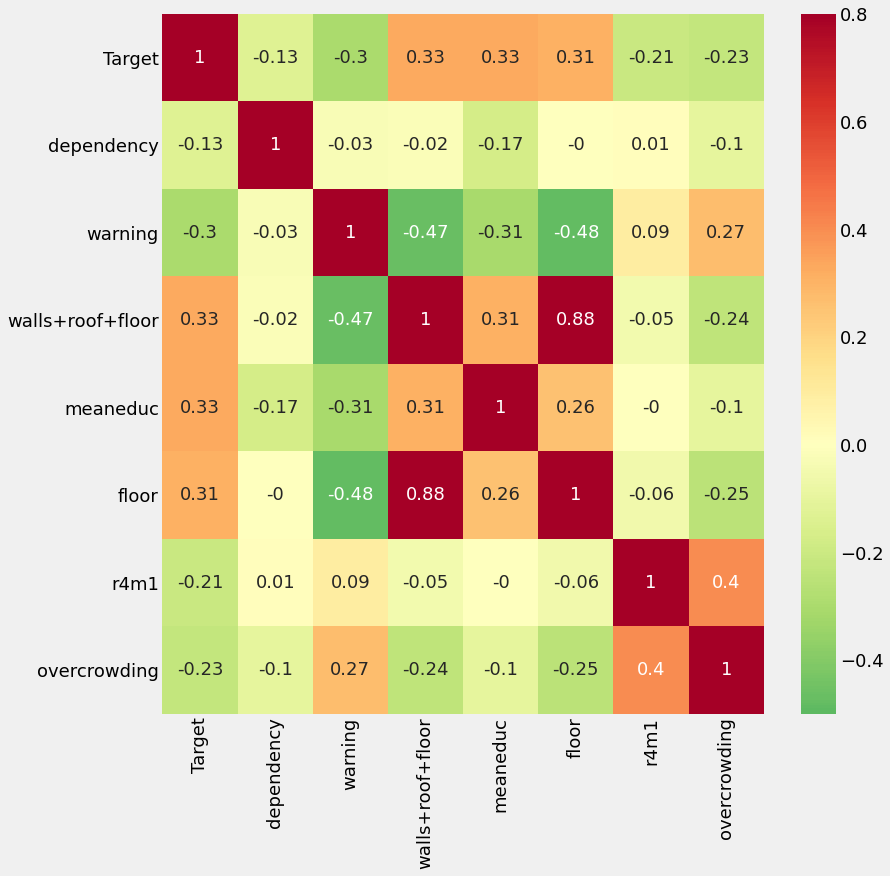

In [350]:
variables = ['Target', 'dependency', 'warning', 'walls+roof+floor', 'meaneduc', 'floor', 'r4m1', 'overcrowding']

corr_mat = train_heads[variables].corr().round(2)

plt.rcParams['font.size'] = 18
plt.figure(figsize=(12, 12))
sns.heatmap(corr_mat, vmin=-0.5, vmax=0.8, center=0, cmap=plt.cm.RdYlGn_r, annot=True)

floor와 walls+roof+floor 같은 variable 간의 collinearity는 나중에 문제가 될 수 있음

Text(0.5, 1.05, 'Feature Plots Colored By Target')

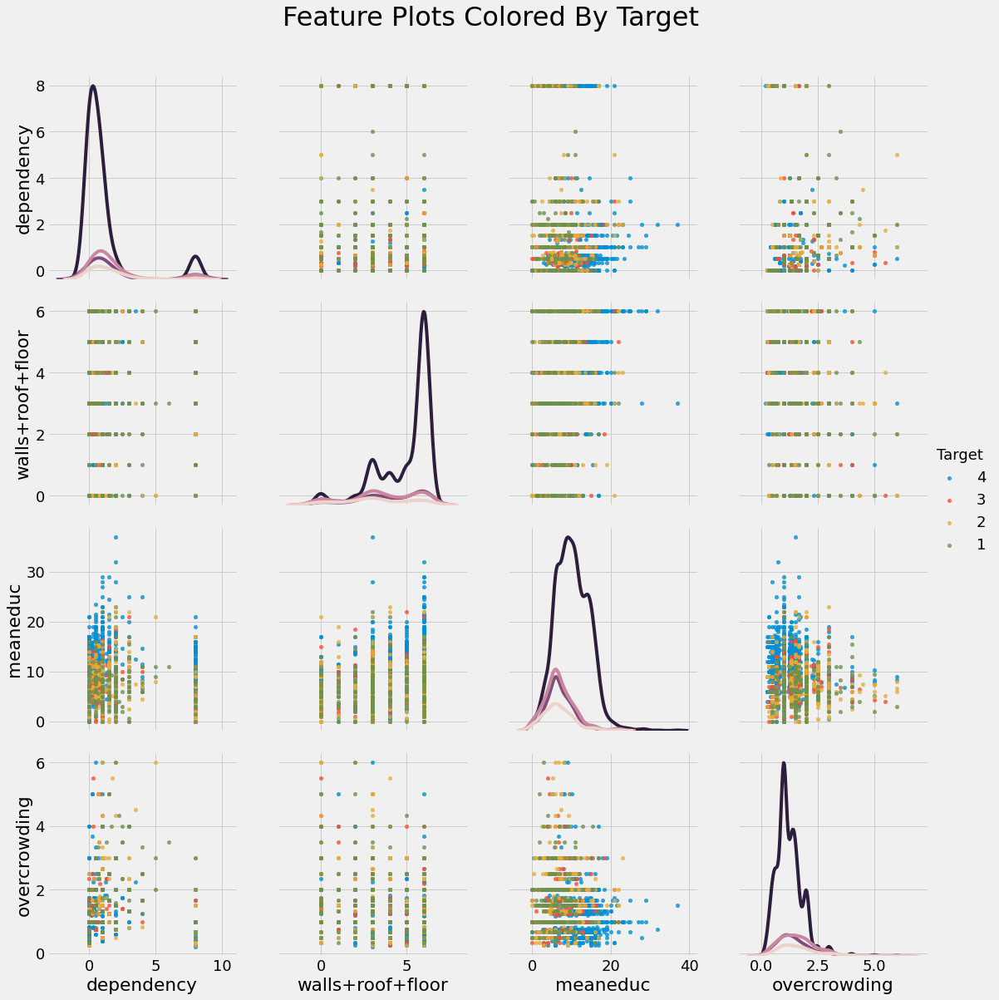

In [355]:
import warnings
warnings.filterwarnings('ignore')

plot_data = train_heads[['Target', 'dependency', 'walls+roof+floor', 'meaneduc', 'overcrowding']]

grid = sns.PairGrid(data=plot_data, size=4, diag_sharey=False,
                   hue='Target', hue_order=[4, 3, 2, 1],
                   vars=[x for x in list(plot_data.columns) if x != 'Target'])

grid.map_upper(plt.scatter, alpha=0.8, s=20)

grid.map_diag(sns.kdeplot)

grid.map_lower(plt.scatter, alpha=0.8, s=20)
# grid.map_lower(sns.kdeplot, cmap=plt.cm.OrRd_r)

grid = grid.add_legend()
plt.suptitle('Feature Plots Colored By Target', size=32, y=1.05)

In [356]:
household_feats = list(heads.columns)

In [361]:
household_feats

['Id',
 'idhogar',
 'Target',
 'hacdor',
 'hacapo',
 'v14a',
 'refrig',
 'paredblolad',
 'paredzocalo',
 'paredpreb',
 'pisocemento',
 'pareddes',
 'paredmad',
 'paredzinc',
 'paredfibras',
 'paredother',
 'pisomoscer',
 'pisoother',
 'pisonatur',
 'pisonotiene',
 'pisomadera',
 'techozinc',
 'techoentrepiso',
 'techocane',
 'techootro',
 'cielorazo',
 'abastaguadentro',
 'abastaguafuera',
 'abastaguano',
 'public',
 'planpri',
 'noelec',
 'coopele',
 'sanitario1',
 'sanitario2',
 'sanitario3',
 'sanitario5',
 'sanitario6',
 'energcocinar1',
 'energcocinar2',
 'energcocinar3',
 'energcocinar4',
 'elimbasu1',
 'elimbasu2',
 'elimbasu3',
 'elimbasu4',
 'elimbasu5',
 'elimbasu6',
 'tipovivi1',
 'tipovivi2',
 'tipovivi3',
 'tipovivi4',
 'tipovivi5',
 'computer',
 'television',
 'lugar1',
 'lugar2',
 'lugar3',
 'lugar4',
 'lugar5',
 'lugar6',
 'area1',
 'v2a1-missing',
 'v2a1',
 'dependency',
 'edjefe',
 'edjefa',
 'meaneduc',
 'overcrowding',
 'rooms',
 'r4h1',
 'r4h2',
 'r4h3',
 'r4m1',
 

**Individual Level Variables**

In [360]:
ind = data[id_ + ind_bool + ind_ordered]
ind.shape

(33413, 40)

# 이 과정  전처리 자동화에 쓰기

In [366]:
# Redundant Individual Variables
corr_matrix = ind.corr()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# 하나라도 0.95 이상인 것 제외하기 (다중공선성 제거)
to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.95)]

to_drop

['female']

In [368]:
abs(upper['female']) # male이 1 > 0.95

Target             0.038665
v18q               0.014958
dis                0.010869
male               1.000000
female                  NaN
estadocivil1            NaN
estadocivil2            NaN
estadocivil3            NaN
estadocivil4            NaN
estadocivil5            NaN
estadocivil6            NaN
estadocivil7            NaN
parentesco1             NaN
parentesco2             NaN
parentesco3             NaN
parentesco4             NaN
parentesco5             NaN
parentesco6             NaN
parentesco7             NaN
parentesco8             NaN
parentesco9             NaN
parentesco10            NaN
parentesco11            NaN
parentesco12            NaN
instlevel1              NaN
instlevel2              NaN
instlevel3              NaN
instlevel4              NaN
instlevel5              NaN
instlevel6              NaN
instlevel7              NaN
instlevel8              NaN
instlevel9              NaN
mobilephone             NaN
rez_esc-missing         NaN
rez_esc             

In [369]:
# 반대인 male 지우기
ind = ind.drop(columns='male')

**Creating Ordinal Variables**

In [371]:
ind[[c for c in ind if c.startswith('instl')]].head()

,instlevel1,instlevel2,instlevel3,instlevel4,instlevel5,instlevel6,instlevel7,instlevel8,instlevel9
0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0
2,0,0,0,0,1,0,0,0,0
3,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0


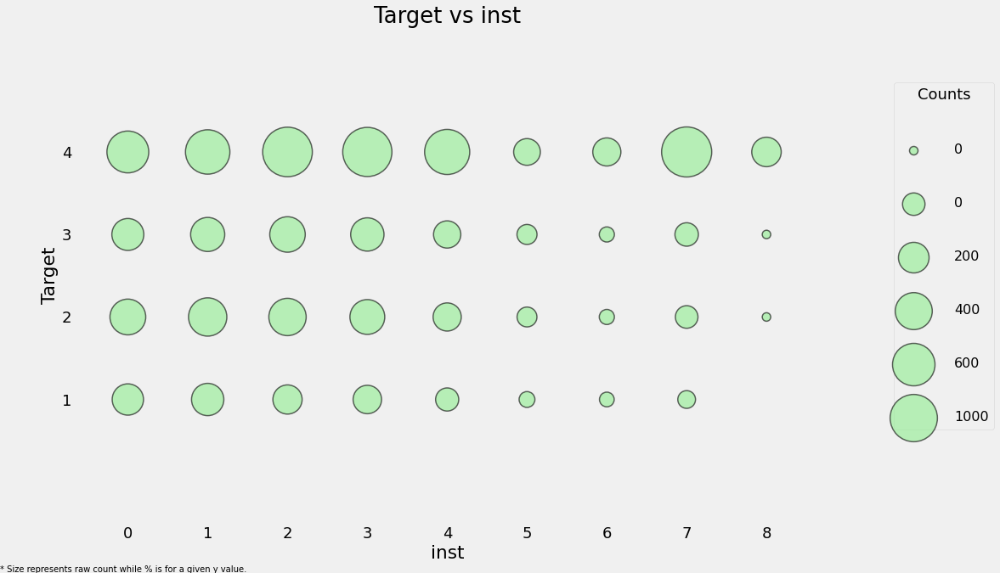

In [372]:
ind['inst'] = np.argmax(np.array(ind[[c for c in ind if c.startswith('instl')]]), axis=1)

plot_categoricals('inst', 'Target', ind, annotate=False)

Text(0.5, 1.0, 'Education Distribution by Target')

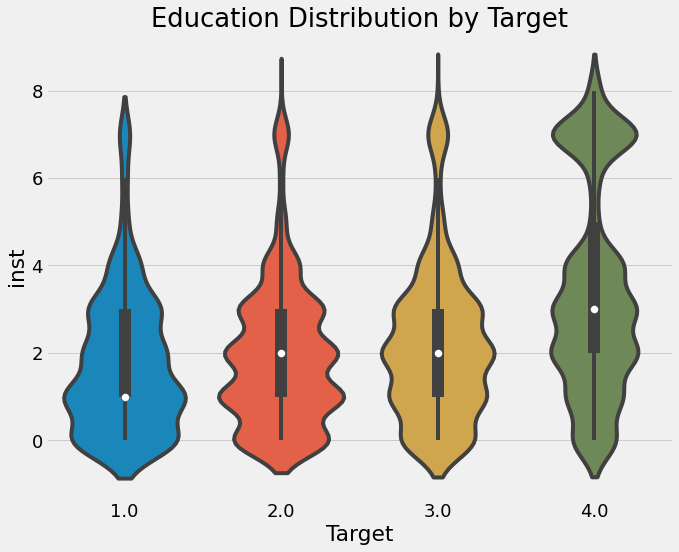

In [373]:
plt.figure(figsize=(10, 8))
sns.violinplot(x='Target', y='inst', data=ind)
plt.title('Education Distribution by Target')

In [374]:
ind.shape

(33413, 40)

**Feature Construction**

<AxesSubplot:xlabel='Target', ylabel='escolari_age'>

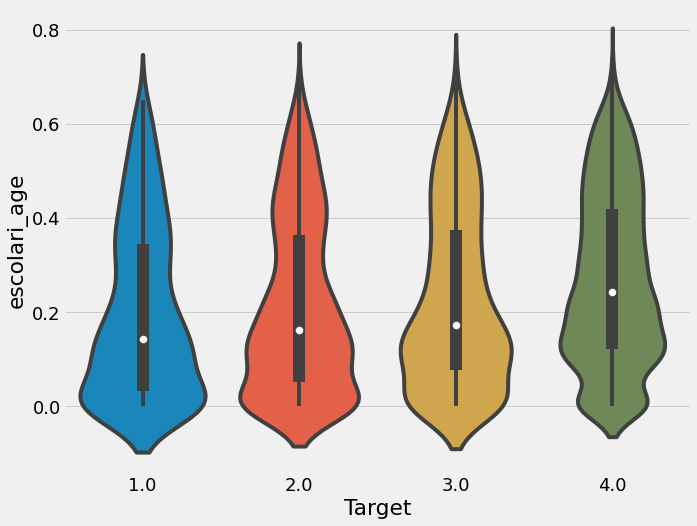

In [376]:
ind['escolari_age'] = ind['escolari'] / ind['age']

plt.figure(figsize=(10, 8))
sns.violinplot('Target', 'escolari_age', data=ind)

In [377]:
ind['inst/age'] = ind['inst'] / ind['age']
ind['tech'] = ind['v18q'] + ind['mobilephone']
ind['tech'].describe()

count    33413.000000
mean         1.214886
std          0.462567
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          2.000000
Name: tech, dtype: float64

**Feature Engineering through Aggregations**

In [389]:
range_ = lambda x: x.max() - x.min()
range_.__name__ = 'range_'

ind_agg = ind.drop(columns=['Target', 'Id']).groupby('idhogar').agg(['min', 'max', 'sum', 'count', 'std', range_])
ind_agg.head()

v18q                           dis                                 \
           min max sum count  std range_ min max sum count       std range_   
idhogar                                                                       
000a08204    1   1   3     3  0.0      0   0   0   0     3  0.000000      0   
000bce7c4    0   0   0     2  0.0      0   0   1   1     2  0.707107      1   
001845fb0    0   0   0     4  0.0      0   0   0   0     4  0.000000      0   
001ff74ca    1   1   2     2  0.0      0   0   0   0     2  0.000000      0   
003123ec2    0   0   0     4  0.0      0   0   0   0     4  0.000000      0   

          female                                estadocivil1                \
             min max sum count       std range_          min max sum count   
idhogar                                                                      
000a08204      0   1   1     3  0.577350      1            0   1   1     3   
000bce7c4      0   1   1     2  0.707107      1            0   0   0     2   
001845fb0      0   1   2     4  0.577350      1            0   0   0     4   
001ff74ca      1   1   2     2  0.000000      0            0   1   1     2   
003123ec2      0   1   1     4  0.500000      1            0   1   2     4   

                           estadocivil2                                \
                std range_          min max sum count      std range_   
idhogar                                                                 
000a08204  0.577350      1            0   1   2     3  0.57735      1   
000bce7c4  0.000000      0            0   0   0     2  0.00000      0   
001845fb0  0.000000      0            0   1   2     4  0.57735      1   
001ff74ca  0.707107      1            0   0   0     2  0.00000      0   
003123ec2  0.577350      1            0   1   2     4  0.57735      1   

          estadocivil3                           estadocivil4                \
                   min max sum count  std range_          min max sum count   
idhogar                                                                       
000a08204            0   0   0     3  0.0      0            0   0   0     3   
000bce7c4            1   1   2     2  0.0      0            0   0   0     2   
001845fb0            0   0   0     4  0.0      0            0   0   0     4   
001ff74ca            0   0   0     2  0.0      0            0   0   0     2   
003123ec2            0   0   0     4  0.0      0            0   0   0     4   

                      estadocivil5                                 \
           std range_          min max sum count       std range_   
idhogar                                                             
000a08204  0.0      0            0   0   0     3  0.000000      0   
000bce7c4  0.0      0            0   0   0     2  0.000000      0   
001845fb0  0.0      0            0   0   0     4  0.000000      0   
001ff74ca  0.0      0            0   1   1     2  0.707107      1   
003123ec2  0.0      0            0   0   0     4  0.000000      0   

          estadocivil6                           estadocivil7                \
                   min max sum count  std range_          min max sum count   
idhogar                                                                       
000a08204            0   0   0     3  0.0      0            0   0   0     3   
000bce7c4            0   0   0     2  0.0      0            0   0   0     2   
001845fb0            0   0   0     4  0.0      0            0   1   2     4   
001ff74ca            0   0   0     2  0.0      0            0   0   0     2   
003123ec2            0   0   0     4  0.0      0            0   0   0     4   

                          parentesco1                                 \
               std range_         min max sum count       std range_   
idhogar                                                                
000a08204  0.00000      0           0   1   1     3  0.577350      1   
000bce7c4  0.00000      0           0   1   1     2  0.70710

In [395]:
new_col = []

for c in ind_agg.columns.levels[0]:
    for stat in ind_agg.columns.levels[1]:
        new_col.append(f'{c}-{stat}')

ind_agg.columns = new_col
ind_agg.head()

,v18q-min,v18q-max,v18q-sum,v18q-count,v18q-std,v18q-range_,dis-min,dis-max,dis-sum,dis-count,dis-std,dis-range_,female-min,female-max,female-sum,female-count,female-std,female-range_,estadocivil1-min,estadocivil1-max,estadocivil1-sum,estadocivil1-count,estadocivil1-std,estadocivil1-range_,estadocivil2-min,estadocivil2-max,estadocivil2-sum,estadocivil2-count,estadocivil2-std,estadocivil2-range_,estadocivil3-min,estadocivil3-max,estadocivil3-sum,estadocivil3-count,estadocivil3-std,estadocivil3-range_,estadocivil4-min,estadocivil4-max,estadocivil4-sum,estadocivil4-count,estadocivil4-std,estadocivil4-range_,estadocivil5-min,estadocivil5-max,estadocivil5-sum,estadocivil5-count,estadocivil5-std,estadocivil5-range_,estadocivil6-min,estadocivil6-max,estadocivil6-sum,estadocivil6-count,estadocivil6-std,estadocivil6-range_,estadocivil7-min,estadocivil7-max,estadocivil7-sum,estadocivil7-count,estadocivil7-std,estadocivil7-range_,parentesco1-min,parentesco1-max,parentesco1-sum,parentesco1-count,parentesco1-std,parentesco1-range_,parentesco2-min,parentesco2-max,parentesco2-sum,parentesco2-count,parentesco2-std,parentesco2-range_,parentesco3-min,parentesco3-max,parentesco3-sum,...,instlevel5-count,instlevel5-std,instlevel5-range_,instlevel6-min,instlevel6-max,instlevel6-sum,instlevel6-count,instlevel6-std,instlevel6-range_,instlevel7-min,instlevel7-max,instlevel7-sum,instlevel7-count,instlevel7-std,instlevel7-range_,instlevel8-min,instlevel8-max,instlevel8-sum,instlevel8-count,instlevel8-std,instlevel8-range_,instlevel9-min,instlevel9-max,instlevel9-sum,instlevel9-count,instlevel9-std,instlevel9-range_,mobilephone-min,mobilephone-max,mobilephone-sum,mobilephone-count,mobilephone-std,mobilephone-range_,rez_esc-min,rez_esc-max,rez_esc-sum,rez_esc-count,rez_esc-std,rez_esc-range_,escolari-min,escolari-max,escolari-sum,escolari-count,escolari-std,escolari-range_,age-min,age-max,age-sum,age-count,age-std,age-range_,inst-min,inst-max,inst-sum,inst-count,inst-std,inst-range_,escolari_age-min,escolari_age-max,escolari_age-sum,escolari_age-count,escolari_age-std,escolari_age-range_,inst/age-min,inst/age-max,inst/age-sum,inst/age-count,inst/age-std,inst/age-range_,tech-min,tech-max,tech-sum,tech-count,tech-std,tech-range_
idhogar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
000a08204,1,1,3,3,0.0,0,0,0,0,3,0.000000,0,0,1,1,3,0.577350,1,0,1,1,3,0.577350,1,0,1,2,3,0.57735,1,0,0,0,3,0.0,0,0,0,0,3,0.0,0,0,0,0,3,0.000000,0,0,0,0,3,0.0,0,0,0,0,3,0.00000,0,0,1,1,3,0.577350,1,0,1,1,3,0.577350,1,0,1,1,...,3,0.0,0,0,0,0,3,0.0,0,0,0,0,3,0.0,0,0,1,2,3,0.577350,1,0,0,0,3,0.0,0,1,1,3,3,0.0,0,0.0,0.0,0.0,3,0.0,0.0,0,14,26,3,7.571878,14,4,30,62,3,14.468356,26,0,7,14,3,4.041452,7,0.000000,0.500000,0.900000,3,0.264575,0.500000,0.000000,0.250000,0.483333,3,0.139775,0.250000,2,2,6,3,0.0,0
000bce7c4,0,0,0,2,0.0,0,0,1,1,2,0.707107,1,0,1,1,2,0.707107,1,0,0,0,2,0.000000,0,0,0,0,2,0.00000,0,1,1,2,2,0.0,0,0,0,0,2,0.0,0,0,0,0,2,0.000000,0,0,0,0,2,0.0,0,0,0,0,2,0.00000,0,0,1,1,2,0.707107,1,0,1,1,2,0.707107,1,0,0,0,...,2,0.0,0,0,0,0,2,0.0,0,0,0,0,2,0.0,0,0,0,0,2,0.000000,0,0,0,0,2,0.0,0,1,1,2,2,0.0,0,0.0,0.0,0.0,2,0.0,0.0,0,5,5,2,3.535534,5,60,63,123,2,2.121320,3,0,1,1,2,0.707107,1,0.000000,0.083333,0.083333,2,0.058926,0.083333,0.000000,0.016667,0.016667,2,0.011785,0.016667,1,1,2,2,0.0,0
001845fb0,0,0,0,4,0.0,0,0,0,0,4,0.000000,0,0,1,2,4,0.577350,1,0,0,0,4,0.000000,0,0,1,2,4,0.57735,1,0,0,0,4,0.0,0,0,0,0,4,0.0,0,0,0,0,4,0.000000,0,0,0,0,4,0.0,0,0,1,2,4,0.57735,1,0,1,1,4,0.500000,1,0,1,1,4,0.500000,1,0,1,2,...,4,0.5,1,0,0,0,4,0.0,0,0,0,0,4,0.0,0,0,1,1,4,0.500000,1,0,0,0,4,0.0,0,1,1,4,4,0.0,0,0.0,0.0,0.0,3,0.0,0.0,6,14,41,4,3.304038,8,19,52,142,4,16.421531,33,2,7,16,4,2.160247,5,0.115385,0.526316,1.397906,4,0.183106,0.410931,0.038462,0.166667,0.511959,4,0.060123,0.128205,1,1,4,4,0.0,0
001ff74ca,1,1,2,2,0.0,0,0,0,0,2,0.000000,0,1,1,2,2,0.000000,0,0,1,1,2,0.707107,1,0,0,0,2,0.00

In [396]:
ind_agg.iloc[:, [0, 1, 2, 3, 6, 7, 8, 9]].head()

,v18q-min,v18q-max,v18q-sum,v18q-count,dis-min,dis-max,dis-sum,dis-count
idhogar,,,,,,,,
000a08204,1,1,3,3,0,0,0,3
000bce7c4,0,0,0,2,0,1,1,2
001845fb0,0,0,0,4,0,0,0,4
001ff74ca,1,1,2,2,0,0,0,2
003123ec2,0,0,0,4,0,0,0,4


**Feature Selection**

In [397]:
corr_matrix = ind_agg.corr()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# 상삼각형으로 그려놨으므로 같은 correlation 두 번 측정 안 하니까 한 번이라도 나오면 지워도 됨
to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.95)]

print(f'There are {len(to_drop)} correlated columns to remove.')

There are 111 correlated columns to remove.


In [400]:
ind_agg = ind_agg.drop(columns=to_drop)
ind_feats = list(ind_agg.columns)

final = heads.merge(ind_agg, on='idhogar', how='left')

print('Final features shape: ', final.shape)

Final features shape:  (10307, 222)


In [401]:
final.head()

,Id,idhogar,Target,hacdor,hacapo,v14a,refrig,paredblolad,paredzocalo,paredpreb,pisocemento,pareddes,paredmad,paredzinc,paredfibras,paredother,pisomoscer,pisoother,pisonatur,pisonotiene,pisomadera,techozinc,techoentrepiso,techocane,techootro,cielorazo,abastaguadentro,abastaguafuera,abastaguano,public,planpri,noelec,coopele,sanitario1,sanitario2,sanitario3,sanitario5,sanitario6,energcocinar1,energcocinar2,energcocinar3,energcocinar4,elimbasu1,elimbasu2,elimbasu3,elimbasu4,elimbasu5,elimbasu6,tipovivi1,tipovivi2,tipovivi3,tipovivi4,tipovivi5,computer,television,lugar1,lugar2,lugar3,lugar4,lugar5,lugar6,area1,v2a1-missing,v2a1,dependency,edjefe,edjefa,meaneduc,overcrowding,rooms,r4h1,r4h2,r4h3,r4m1,r4m2,...,parentesco6-max,parentesco6-sum,parentesco7-min,parentesco7-max,parentesco8-min,parentesco8-max,parentesco9-min,parentesco9-max,parentesco9-sum,parentesco10-min,parentesco10-max,parentesco11-min,parentesco11-max,parentesco11-sum,parentesco12-min,parentesco12-max,parentesco12-sum,instlevel1-min,instlevel1-max,instlevel1-sum,instlevel2-min,instlevel2-max,instlevel2-sum,instlevel2-std,instlevel3-min,instlevel3-max,instlevel3-sum,instlevel3-std,instlevel4-min,instlevel4-max,instlevel4-sum,instlevel4-std,instlevel5-min,instlevel5-max,instlevel5-sum,instlevel6-min,instlevel6-max,instlevel7-min,instlevel7-max,instlevel8-min,instlevel8-max,instlevel8-sum,instlevel8-std,instlevel9-min,instlevel9-max,mobilephone-min,mobilephone-std,mobilephone-range_,rez_esc-min,rez_esc-max,escolari-min,escolari-max,escolari-sum,escolari-std,escolari-range_,age-min,age-max,age-sum,age-std,age-range_,inst-max,inst-std,inst-range_,escolari_age-min,escolari_age-max,escolari_age-sum,escolari_age-std,escolari_age-range_,inst/age-max,inst/age-std,inst/age-range_,tech-min,tech-sum,tech-std,tech-range_
0,ID_279628684,21eb7fcc1,4.0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,False,190000.0,0.0,10.0,0.0,10.0,1.000000,3,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,NaN,1,1,1,NaN,0,0,0,0,0,0,0,0,0,0,NaN,0,0,1,NaN,0,0.0,0.0,10,10,10,NaN,0,43,43,43,NaN,0,3,NaN,0,0.232558,0.232558,0.232558,NaN,0.000000,0.069767,NaN,0.000000,1,1,NaN,0
1,ID_f29eb3ddd,0e5d7a658,4.0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,False,135000.0,8.0,12.0,0.0,12.0,1.000000,4,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,NaN,0,0,0,NaN,0,0,0,0,0,0,0,1,1,1,NaN,0,0,1,NaN,0,0.0,0.0,12,12,12,NaN,0,67,67,67,NaN,0,7,NaN,0,0.179104,0.179104,0.179104,NaN,0.000000,0.104478,NaN,0.000000,2,2,NaN,0
2,ID_68de51c94,2c7317ea8,4.0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,False,0.0,8.0,0.0,11.0,11.0,0.500000,8,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,NaN,0,0,0,NaN,1,1,1,0,0,0,0,0,0,0,NaN,0,0,0,NaN,0,0.0,0.0,11,11,11,NaN,0,92,92,92,NaN,0,4,NaN,0,0.119565,0.119565,0.119565,NaN,0.000000,0.043478,NaN,0.000000,0,0,NaN,0
3,ID_ec05b1a7b,2b58d945f,4.0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,False,180000.0,1.0,11.0,0.0,11.0,1.333333,5,0,2,2,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.5,0,0,0,0.0,0,1,1,0.5,0,1,2,0,0,0,0,0,0,0,0.0,0,0,1,0.0,0,0.0,1.0,2,11,33,4.272002,9,8,38,100,14.899664,30,4,1.414214,3,0.250000,0.529412,1.366183,0.126943,0.279412,0.176471,0.033010,0.071207,2,8,0.0,0
4,ID_1284f8aad,d6dae86b7,4.0,1,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,False,130000.0,1.0,9.0,0.0,10.0,4.000000,2,0,1,1,2,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0.5,0,0,0,0.0,0,1,1,0.5,0,1,1,0,0,0,0,0,0,0,0.0,0,0,1,0.0,0,0.0,1.0,0,11,23,5.123475,11,7,30,76,11.690452,23,4,1.825742,4,0.000000,0.392857,0.965584,0.168946,0.392857,0.142857,0.060063,0.142857,1,4,0.0,0


**Final Data Exploration**

In [402]:
corrs = final.corr()['Target']

In [403]:
corrs.sort_values().head()

warning          -0.301791
instlevel2-sum   -0.297868
instlevel1-sum   -0.271204
hogar_nin        -0.266309
r4t1             -0.260917
Name: Target, dtype: float64

In [404]:
corrs.sort_values().dropna().tail()

walls+roof+floor    0.332446
meaneduc            0.333652
inst-max            0.368229
escolari-max        0.373091
Target              1.000000
Name: Target, dtype: float64

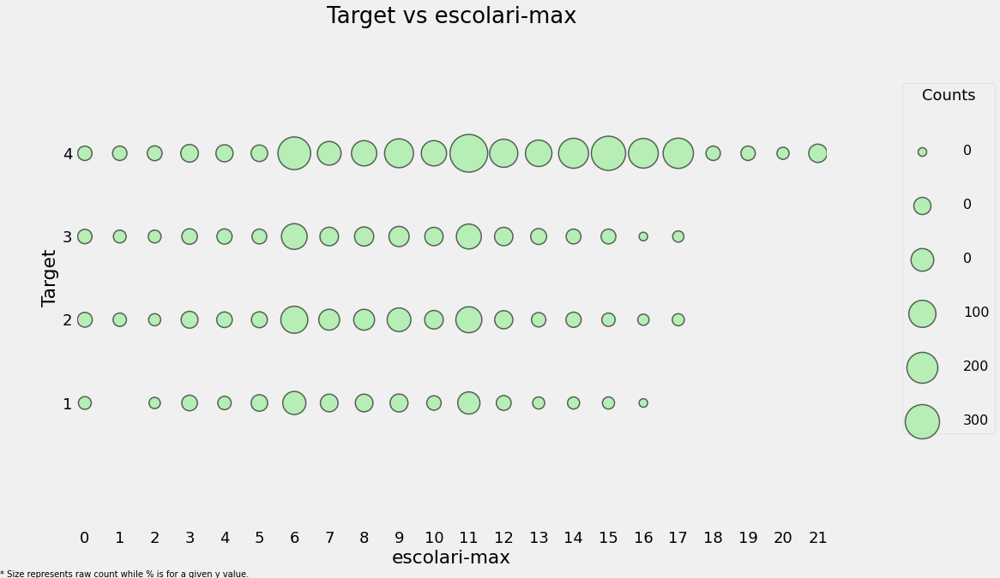

In [405]:
plot_categoricals('escolari-max', 'Target', final, annotate=False)

Text(0.5, 1.0, 'Max Schooling by Target')

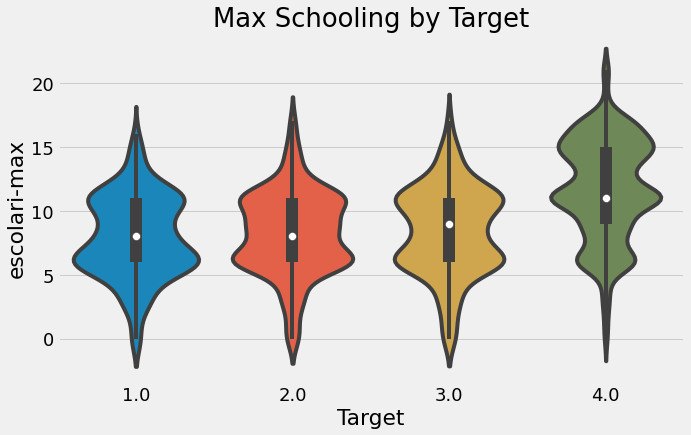

In [406]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='Target', y='escolari-max', data=final)
plt.title('Max Schooling by Target')

Text(0.5, 1.0, 'Max Schooling by Target')

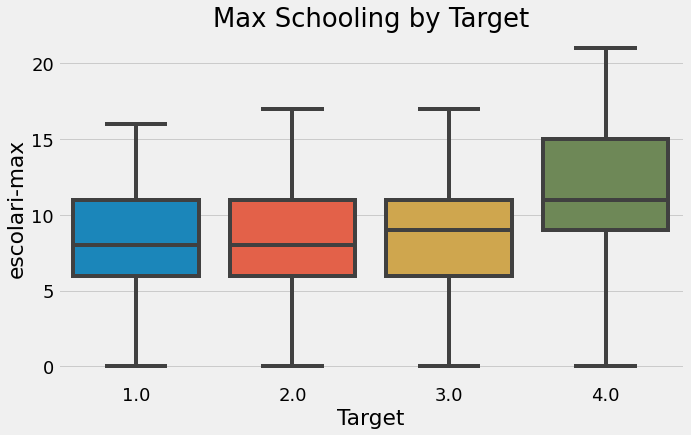

In [407]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Target', y='escolari-max', data=final)
plt.title('Max Schooling by Target')

Text(0.5, 1.0, 'Average Schooling by Target')

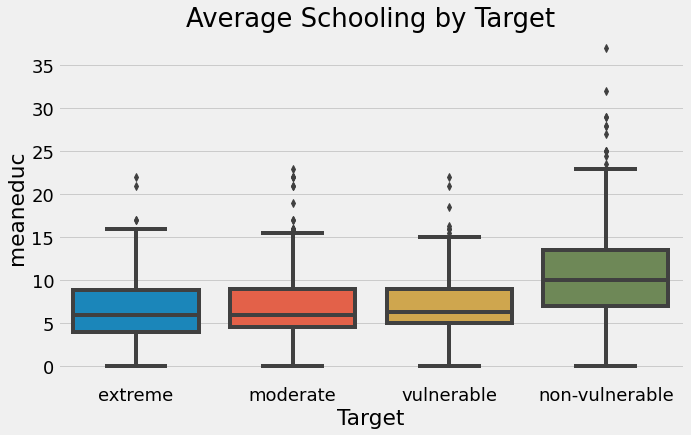

In [408]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Target', y='meaneduc', data=final)
plt.xticks([0, 1, 2, 3], poverty_mapping.values())
plt.title('Average Schooling by Target')

Text(0.5, 1.0, 'Overcrowding by Target')

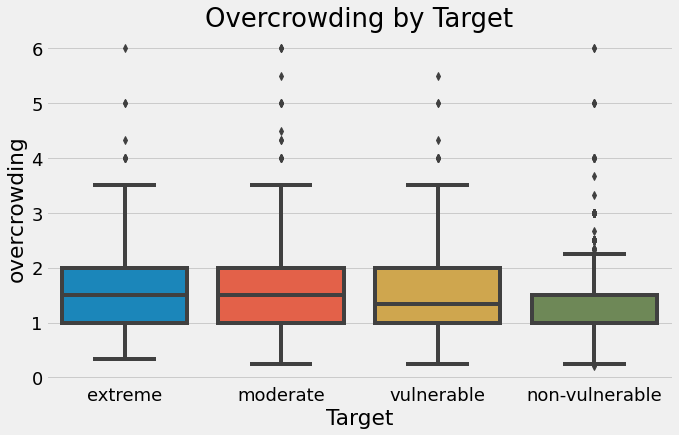

In [410]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Target', y='overcrowding', data=final)
plt.xticks([0, 1, 2, 3], poverty_mapping.values())
plt.title('Overcrowding by Target')

In [411]:
head_gender = ind.loc[ind['parentesco1'] == 1, ['idhogar', 'female']]  # parentesco1 넣은 것은 어차피 final 대상 데이터도 parentesco1만 취급하므로
final = final.merge(head_gender, on='idhogar', how='left').rename(columns={'female': 'female-head'})

In [422]:
final.groupby('female-head')['Target'].value_counts(normalize=True)

female-head  Target
0            4.0       0.682873
             2.0       0.136464
             3.0       0.123204
             1.0       0.057459
1            4.0       0.617369
             2.0       0.167670
             3.0       0.113500
             1.0       0.101462
Name: Target, dtype: float64

Text(0.5, 1.0, 'Target by Female Head of Household')

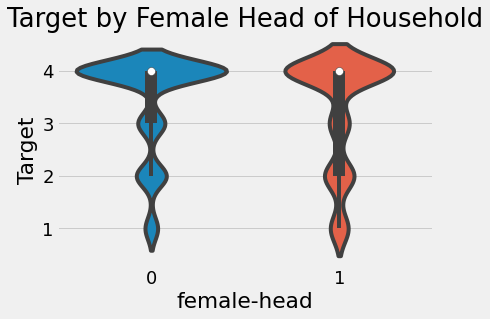

In [423]:
sns.violinplot(x='female-head', y='Target', data=final)
plt.title('Target by Female Head of Household')

Text(0.5, 1.0, 'Average Education by Target and Female Head of Household')

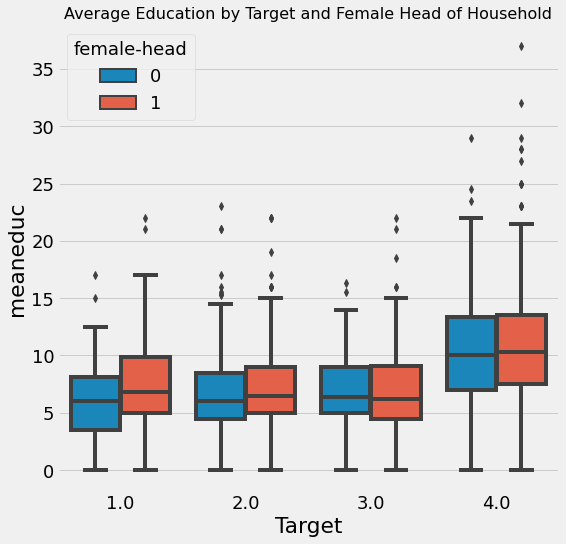

In [426]:
plt.figure(figsize=(8, 8))
sns.boxplot(x='Target', y='meaneduc', hue='female-head', data=final)  # hue로 여러 데이터 나타냄
plt.title('Average Education by Target and Female Head of Household', size=16)

**Machine Learning Modeling**

In [428]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline

In [429]:
scorer = make_scorer(f1_score, greater_is_better=True, average='macro')

In [499]:
train_labels = np.array(list(final[final['Target'].notnull()]['Target'].astype(np.uint8))) # null인 값들은 test 데이터

train_set = final[final['Target'].notnull()].drop(columns=['Id', 'idhogar', 'Target'])

test_set = final[final['Target'].isnull()].drop(columns=['Id', 'idhogar', 'Target'])

submission_base = test[['Id', 'idhogar']].copy()

In [500]:
# impute는 median

features = list(train_set.columns)

pipeline = Pipeline([('imputer', SimpleImputer(strategy='median')),
                    ('scaler', MinMaxScaler())])

# https://dsbook.tistory.com/107
# fit_transform은 통해 변환을 위한 값들을 저장하고 변환 (Train에서 사용)
# transform은 앞서 설정한 값들로 변환만 수행
train_set = pipeline.fit_transform(train_set)
test_set = pipeline.transform(test_set)

In [440]:
model = RandomForestClassifier(n_estimators=100,
                              random_state=10,
                              n_jobs=-1)

cv_score = cross_val_score(model, train_set, train_labels,
                          cv=10, scoring=scorer)

print(f'10 Fold Cross Validation F1 Score = {round(cv_score.mean(), 4)} with std = {round(cv_score.std(), 4)}')

10 Fold Cross Validation F1 Score = 0.3548 with std = 0.0359


In [441]:
model.fit(train_set, train_labels)

feature_importances = pd.DataFrame({'feature': features,
                                   'importance': model.feature_importances_})

feature_importances.head()

,feature,importance
0,hacdor,0.000653
1,hacapo,0.000659
2,v14a,0.000404
3,refrig,0.001832
4,paredblolad,0.006103


In [444]:
def plot_feature_importances(df, n=10, threshold=None):
    plt.style.use('fivethirtyeight')
    plt.rcParams['font.size'] = 12
    
    df = df.sort_values('importance', ascending=False).reset_index(drop=True)
    
    df['importance_normalized'] = df['importance'] / df['importance'].sum()
    
    df['cumulative_importance'] = np.cumsum(df['importance_normalized'])
    
    df.loc[:n, :].plot.barh(y='importance_normalized',
                           x='feature',
                           color='darkgreen',
                           edgecolor='k',
                           figsize=(12, 8),
                           legend=False,
                           linewidth=2)
    
    plt.xlabel('Normalized Importance', size=18)
    plt.ylabel('')
    
    plt.title(f'{n} Most Importance Features', size=18)
    plt.gca().invert_yaxis()
    
    if threshold:
        plt.figure(figsize=(8, 6))
        plt.plot(list(range(len(df))), df['cumulative_importance'], 'b-')
        plt.xlabel('Number of Features', size=16)
        plt.ylabel('Cumulative Importance', size=16)
        plt.title('Cumulative Feature Importance', size=18)
        
        importance_index = np.min(np.where(df['cumulative_importance'] > threshold))
        
        plt.vlines(importance_index + 1, ymin=0, ymax=1.05,
                  linestyles='--', colors='red')
        plt.show()
        
        print('{} features required for {:.0f}% of cumulative importance.'.format(importance_index + 1, 100 * threshold))
        
    return df

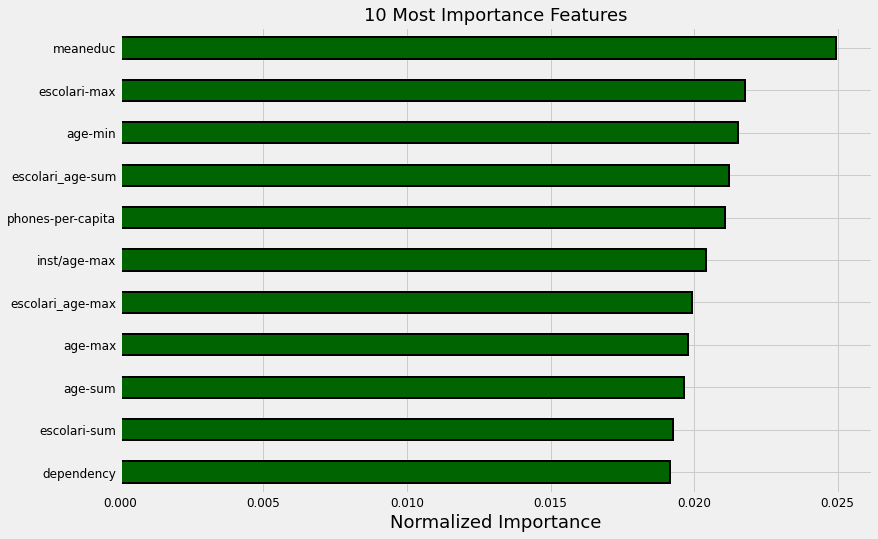

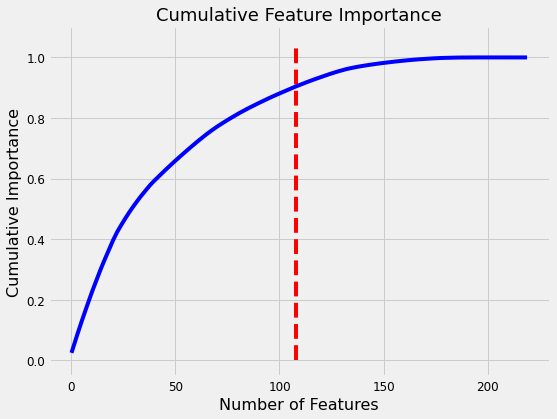

108 features required for 90% of cumulative importance.


In [448]:
norm_fi = plot_feature_importances(feature_importances,
                                  threshold=0.90)

In [452]:
def kde_target(df, variable):
    colors = {1: 'red', 2: 'orange', 3: 'blue', 4: 'green'}
    
    plt.figure(figsize=(12, 8))
    
    df = df[df['Target'].notnull()]
    
    for level in df['Target'].unique():
        subset = df[df['Target'] == level].copy()
        sns.kdeplot(subset[variable].dropna(),
                   label=f'Poverty Level: {level}',
                   color=colors[int(subset['Target'].unique())])
                                
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.legend()
    plt.title('{} Distribution'.format(variable.capitalize()))

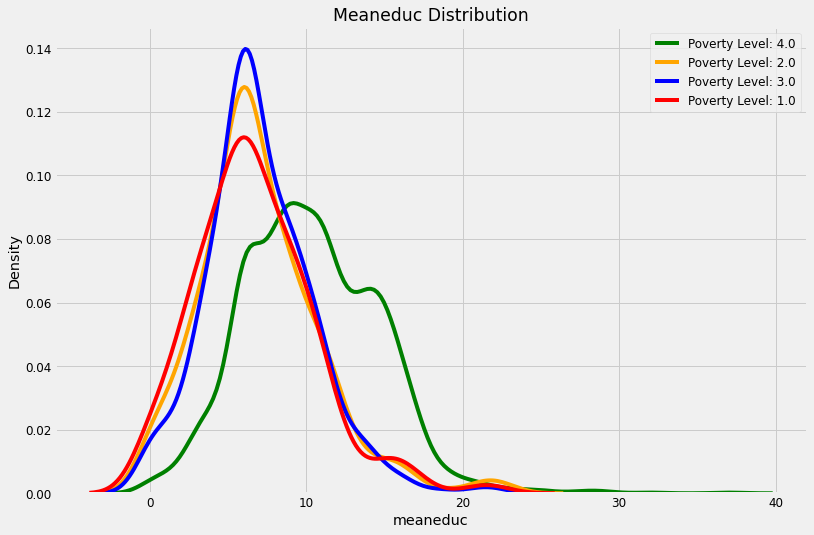

In [453]:
kde_target(final, 'meaneduc')

**Model Selection**

In [455]:
# model imports
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegressionCV, RidgeClassifierCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier

In [466]:
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings('ignore', category=ConvergenceWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=UserWarning)

# model_results 선언해놓고 계속 결과 붙이기
model_results = pd.DataFrame(columns=['model', 'cv_mean', 'cv_std'])

def cv_model(train, train_labels, model, name, model_results=None):
    cv_scores = cross_val_score(model, train, train_labels, cv=10, scoring=scorer, n_jobs=-1)
    print(f'10 Fold CV Score: {round(cv_scores.mean(), 5)} with std: {round(cv_scores.std(), 5)}')
    
    if model_results is not None:
        model_results = model_results.append(pd.DataFrame({'model': name,
                                                          'cv_mean': cv_scores.mean(),
                                                          'cv_std': cv_scores.std()},
                                                         index= [0]), ignore_index=True)
        
        return model_results

In [467]:
model_results = cv_model(train_set, train_labels, LinearSVC(), 'LSVC', model_results)

10 Fold CV Score: 0.28843 with std: 0.04098


In [468]:
model_results = cv_model(train_set, train_labels, GaussianNB(), 'GNB', model_results)

10 Fold CV Score: 0.18483 with std: 0.03695


/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [469]:
model_results = cv_model(train_set, train_labels, MLPClassifier(hidden_layer_sizes=(32, 64, 128, 64, 32)), 'MLP', model_results)

10 Fold CV Score: 0.31247 with std: 0.05102


/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: C

In [470]:
model_results = cv_model(train_set, train_labels, LinearDiscriminantAnalysis(), 'LDA', model_results)

10 Fold CV Score: 0.31958 with std: 0.06436


In [471]:
model_results = cv_model(train_set, train_labels, RidgeClassifierCV(), 'RIDGE', model_results)

10 Fold CV Score: 0.27327 with std: 0.03501


In [472]:
for n in [5, 10, 20]:
    print(f'\nKNN with {n} neighbors\n')
    model_results = cv_model(train_set, train_labels, KNeighborsClassifier(n_neighbors=n), f'knn-{n}', model_results)


KNN with 5 neighbors

10 Fold CV Score: 0.33977 with std: 0.02047

KNN with 10 neighbors

10 Fold CV Score: 0.32775 with std: 0.04206

KNN with 20 neighbors

10 Fold CV Score: 0.30729 with std: 0.04712


In [473]:
from sklearn.ensemble import ExtraTreesClassifier

model_results = cv_model(train_set, train_labels,
                        ExtraTreesClassifier(n_estimators=100, random_state=10), 'EXT', model_results)

10 Fold CV Score: 0.33707 with std: 0.04101


In [474]:
model_results = cv_model(train_set, train_labels, RandomForestClassifier(100, random_state=10), 'RF', model_results)

10 Fold CV Score: 0.35481 with std: 0.03586


/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


**Comparing Model Performance**

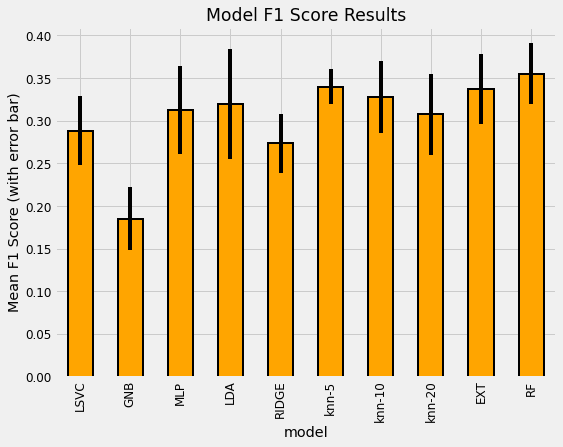

/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/jinwoohong/.pyenv/versions/ml/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [476]:
model_results.set_index('model', inplace=True)
# yerr -> error bar
model_results['cv_mean'].plot.bar(color='orange', figsize=(8, 6),
                                 yerr=list(model_results['cv_std']),
                                 edgecolor='k', linewidth=2)
plt.title('Model F1 Score Results')
plt.ylabel('Mean F1 Score (with error bar)')
model_results.reset_index(inplace=True)

**Submit baseline model**

In [477]:
test_ids = list(final.loc[final['Target'].isnull(), 'idhogar'])

In [481]:
def submit(model, train, train_labels, test, test_ids):
    model.fit(train, train_labels)
    
    predictions = model.predict(test)
    predictions = pd.DataFrame({'idhogar': test_ids,
                               'Target': predictions})
    
    submission = submission_base.merge(predictions,
                                      on='idhogar',
                                      how='left').drop(columns=['idhogar'])
    
    submission['Target'] = submission['Target'].fillna(4).astype(np.int8)
    
    return submission

In [482]:
rf_submission = submit(RandomForestClassifier(n_estimators=100, random_state=10, n_jobs=-1),
                      train_set, train_labels, test_set, test_ids)
rf_submission.to_csv('rf_submission.csv', index=False)

## Model Tuning

**Feature Selection**

In [504]:
train_labels = np.array(list(final[final['Target'].notnull()]['Target'].astype(np.uint8))) # null인 값들은 test 데이터

train_set = final[final['Target'].notnull()].drop(columns=['Id', 'idhogar', 'Target'])

test_set = final[final['Target'].isnull()].drop(columns=['Id', 'idhogar', 'Target'])

submission_base = test[['Id', 'idhogar']].copy()

In [505]:
# impute는 median

features = list(train_set.columns)

pipeline = Pipeline([('imputer', SimpleImputer(strategy='median')),
                    ('scaler', MinMaxScaler())])

# https://dsbook.tistory.com/107
# fit_transform은 통해 변환을 위한 값들을 저장하고 변환 (Train에서 사용)
# transform은 앞서 설정한 값들로 변환만 수행
train_set = pipeline.fit_transform(train_set)
test_set = pipeline.transform(test_set)

In [506]:
train_set = pd.DataFrame(train_set, columns=features)

corr_matrix = train_set.corr()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.95)]

to_drop

['coopele', 'elec', 'v18q-count', 'female-sum']

In [507]:
train_set = train_set.drop(columns=to_drop)
train_set.shape

(2973, 216)

In [508]:
test_set = pd.DataFrame(test_set, columns=features)
train_set, test_set = train_set.align(test_set, axis=1, join='inner')

features = list(train_set.columns)

**Recursive Feature Elimination with Random Forest**

In [509]:
from sklearn.feature_selection import RFECV

estimator = RandomForestClassifier(random_state=10, n_estimators=100, n_jobs=-1)

selector = RFECV(estimator, step=1, cv=3, scoring=scorer, n_jobs=-1)

In [510]:
selector.fit(train_set, train_labels)

RFECV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, random_state=10),
      n_jobs=-1, scoring=make_scorer(f1_score, average=macro))

189

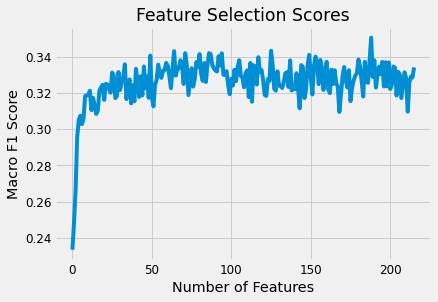

In [511]:
plt.plot(selector.grid_scores_)

plt.xlabel('Number of Features')
plt.ylabel('Macro F1 Score')
plt.title('Feature Selection Scores')
selector.n_features_

In [516]:
rankings = pd.DataFrame({'feature': list(train_set.columns), 
                        'rank': list(selector.ranking_)}).sort_values('rank')
rankings.head(10)

,feature,rank
0,hacdor,1
129,parentesco2-max,1
130,parentesco2-std,1
132,parentesco3-max,1
133,parentesco3-sum,1
135,parentesco4-max,1
136,parentesco4-sum,1
138,parentesco5-max,1
140,parentesco6-max,1
141,parentesco6-sum,1


In [517]:
train_selected = selector.transform(train_set)
test_selected = selector.transform(test_set)

In [520]:
selected_features = train_set.columns[np.where(selector.ranking_==1)]
train_selected = pd.DataFrame(train_selected, columns=selected_features)
test_selected = pd.DataFrame(test_selected, columns=selected_features)

In [521]:
model_results = cv_model(train_selected, train_labels, model, 'RF-SEL', model_results)

10 Fold CV Score: 0.35289 with std: 0.04302


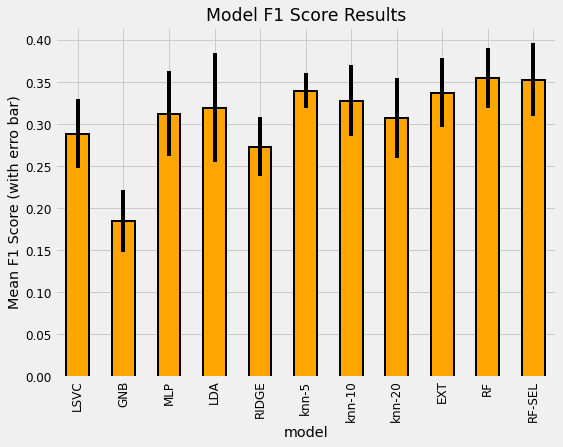

In [523]:
model_results.set_index('model', inplace=True)
model_results['cv_mean'].plot.bar(color='orange', figsize=(8, 6),
                                 yerr=list(model_results['cv_std']),
                                 edgecolor='k', linewidth=2)
plt.title('Model F1 Score Results')
plt.ylabel('Mean F1 Score (with erro bar)')
model_results.reset_index(inplace=True)

**Upgrading Model: Gradient Boosting Machine**

In [525]:
def macro_f1_score(labels, predictions):
    predictions = predictions.reshape(len(np.unique(labels)), -1).argmax(axis=0)
    
    metric_value = f1_score(labels, predictions, average='macro')
    
    return 'macro_f1', metric_value, True

In [549]:
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb
from IPython.display import display

def model_gbm(features, labels, test_features, test_ids, 
              nfolds = 5, return_preds = False, hyp = None):
    """Model using the GBM and cross validation.
       Trains with early stopping on each fold.
       Hyperparameters probably need to be tuned."""
    
    feature_names = list(features.columns)

    # Option for user specified hyperparameters
    if hyp is not None:
        # Using early stopping so do not need number of esimators
        if 'n_estimators' in hyp:
            del hyp['n_estimators']
        params = hyp
    
    else:
        # Model hyperparameters
        params = {'boosting_type': 'dart', 
                  'colsample_bytree': 0.88, 
                  'learning_rate': 0.028, 
                   'min_child_samples': 10, 
                   'num_leaves': 36, 'reg_alpha': 0.76, 
                   'reg_lambda': 0.43, 
                   'subsample_for_bin': 40000, 
                   'subsample': 0.54, 
                   'class_weight': 'balanced'}
    
    # Build the model
    model = lgb.LGBMClassifier(**params, objective = 'multiclass', 
                               n_jobs = -1, n_estimators = 200,
                               random_state = 10)
    
    # Using stratified kfold cross validation
    strkfold = StratifiedKFold(n_splits = nfolds, shuffle = True)
    
    # Hold all the predictions from each fold
    predictions = pd.DataFrame()
    importances = np.zeros(len(feature_names))
    
    # Convert to arrays for indexing
    features = np.array(features)
    test_features = np.array(test_features)
    labels = np.array(labels).reshape((-1 ))
    
    valid_scores = []
    
    # Iterate through the folds
    for i, (train_indices, valid_indices) in enumerate(strkfold.split(features, labels)):
        
        # Dataframe for fold predictions
        fold_predictions = pd.DataFrame()
        
        # Training and validation data
        X_train = features[train_indices]
        X_valid = features[valid_indices]
        y_train = labels[train_indices]
        y_valid = labels[valid_indices]
        
        # Train with early stopping
        model.fit(X_train, y_train, early_stopping_rounds = 100, 
                  eval_metric = macro_f1_score,
                  eval_set = [(X_train, y_train), (X_valid, y_valid)],
                  eval_names = ['train', 'valid'],
                  verbose = 200)
        
        # Record the validation fold score
        valid_scores.append(model.best_score_['valid']['macro_f1'])
        
        # Make predictions from the fold as probabilities
        fold_probabilitites = model.predict_proba(test_features)
        
        # Record each prediction for each class as a separate column
        for j in range(4):
            fold_predictions[(j + 1)] = fold_probabilitites[:, j]
            
        # Add needed information for predictions 
        fold_predictions['idhogar'] = test_ids
        fold_predictions['fold'] = (i+1)
        
        # Add the predictions as new rows to the existing predictions
        predictions = predictions.append(fold_predictions)
        
        # Feature importances
        importances += model.feature_importances_ / nfolds   
        
        # Display fold information
        display(f'Fold {i + 1}, Validation Score: {round(valid_scores[i], 5)}, Estimators Trained: {model.best_iteration_}')

    # Feature importances dataframe
    feature_importances = pd.DataFrame({'feature': feature_names,
                                        'importance': importances})
    
    valid_scores = np.array(valid_scores)
    display(f'{nfolds} cross validation score: {round(valid_scores.mean(), 5)} with std: {round(valid_scores.std(), 5)}.')
    
    # If we want to examine predictions don't average over folds
    if return_preds:
        predictions['Target'] = predictions[[1, 2, 3, 4]].idxmax(axis = 1)
        predictions['confidence'] = predictions[[1, 2, 3, 4]].max(axis = 1)
        return predictions, feature_importances
    
    # Average the predictions over folds
    predictions = predictions.groupby('idhogar', as_index = False).mean()
    
    # Find the class and associated probability
    predictions['Target'] = predictions[[1, 2, 3, 4]].idxmax(axis = 1)
    predictions['confidence'] = predictions[[1, 2, 3, 4]].max(axis = 1)
    predictions = predictions.drop(columns = ['fold'])
    
    # Merge with the base to have one prediction for each individual
    submission = submission_base.merge(predictions[['idhogar', 'Target']], on = 'idhogar', how = 'left').drop(columns = ['idhogar'])
        
    # Fill in the individuals that do not have a head of household with 4 since these will not be scored
    submission['Target'] = submission['Target'].fillna(4).astype(np.int8)
    
    # return the submission and feature importances along with validation scores
    return submission, feature_importances, valid_scores

**Cross Validation with Early Stopping Notes**

In [536]:
%%capture --no-display
# 원래 코드에서 너무 느려서 n_estimators 줄임 
predictions, gbm_fi = model_gbm(train_set, train_labels, test_set, test_ids, return_preds=True)

'Fold 1, Validation Score: 0.40519, Estimators Trained: 0'

'Fold 2, Validation Score: 0.39586, Estimators Trained: 0'

'Fold 3, Validation Score: 0.38582, Estimators Trained: 0'

'Fold 4, Validation Score: 0.44489, Estimators Trained: 0'

'Fold 5, Validation Score: 0.45401, Estimators Trained: 0'

'5 cross validation score: 0.41715 with std: 0.02722.'

In [537]:
predictions.head()

,1,2,3,4,idhogar,fold,Target,confidence
0,0.003009,0.002837,0.003743,0.990412,72958b30c,1,4,0.990412
1,0.019026,0.019023,0.006789,0.955162,5b598fbc9,1,4,0.955162
2,0.028015,0.143379,0.106511,0.722095,1e2fc704e,1,4,0.722095
3,0.004940,0.007783,0.013434,0.973843,8ee7365a8,1,4,0.973843
4,0.005342,0.013252,0.012127,0.969280,ff69a6fc8,1,4,0.969280


Text(0.5, 1.05, 'Distribution of Confidence by Fold and Target')

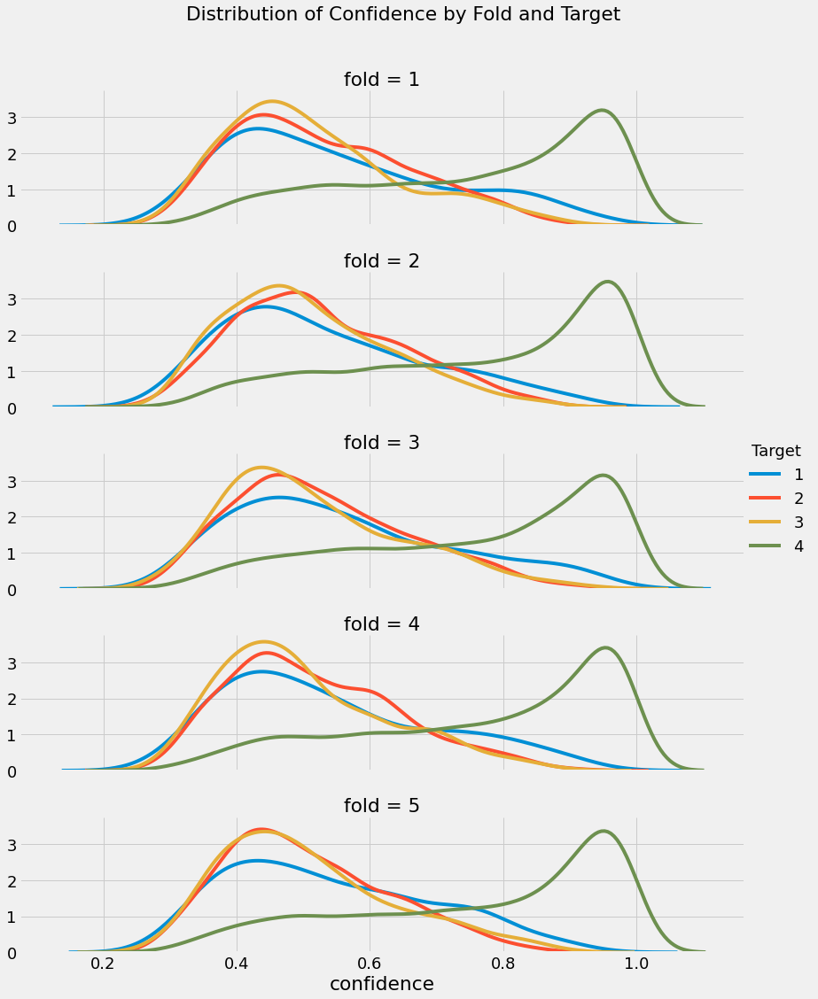

In [538]:
plt.rcParams['font.size'] = 18

g = sns.FacetGrid(predictions, row='fold', hue='Target', size=3, aspect=4)
g.map(sns.kdeplot, 'confidence')
g.add_legend()

plt.suptitle('Distribution of Confidence by Fold and Target', y=1.05)

<AxesSubplot:xlabel='Target', ylabel='confidence'>

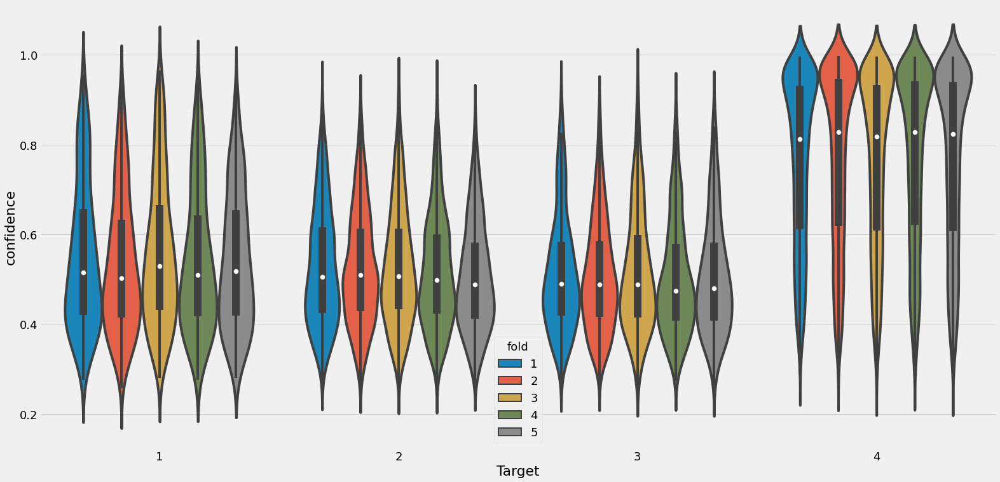

In [539]:
plt.figure(figsize=(24, 12))
sns.violinplot(x='Target', y='confidence', hue='fold', data=predictions)

Text(0.5, 1.0, 'Confidence by Target')

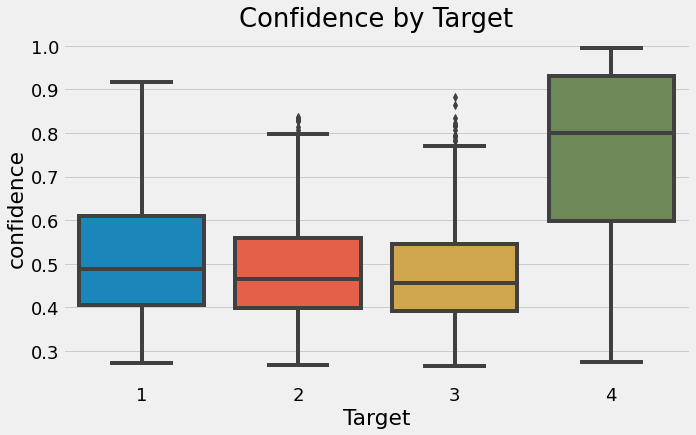

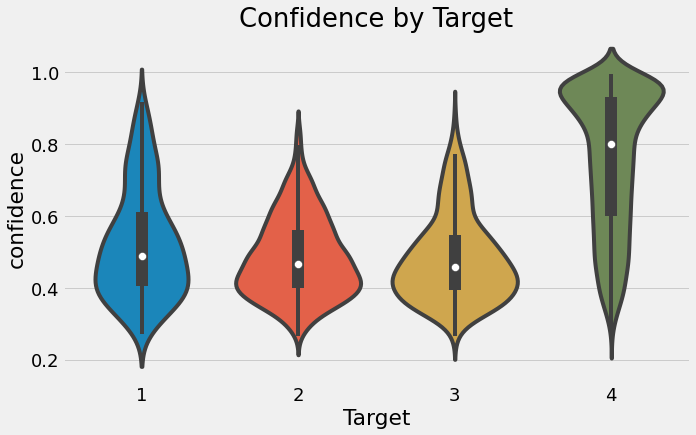

In [540]:
predictions = predictions.groupby('idhogar', as_index=False).mean()

predictions['Target'] = predictions[[1, 2, 3, 4]].idxmax(axis=1)
predictions['confidence'] = predictions[[1, 2, 3, 4]].max(axis=1)
predictions = predictions.drop(columns=['fold'])

plt.figure(figsize=(10, 6))
sns.boxplot(x='Target', y='confidence', data=predictions)
plt.title('Confidence by Target')

plt.figure(figsize=(10, 6))
sns.violinplot(x='Target', y='confidence', data=predictions)
plt.title('Confidence by Target')

In [543]:
%%capture
submission, gbm_fi, valid_scores = model_gbm(train_set, train_labels,
                                            test_set, test_ids, return_preds=False)

submission.to_csv(result_path + 'gbm_baseline.csv')

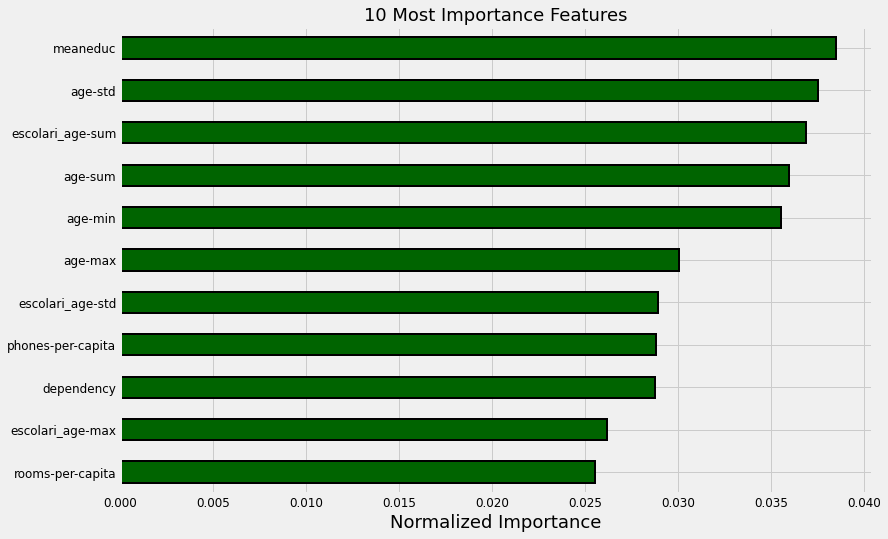

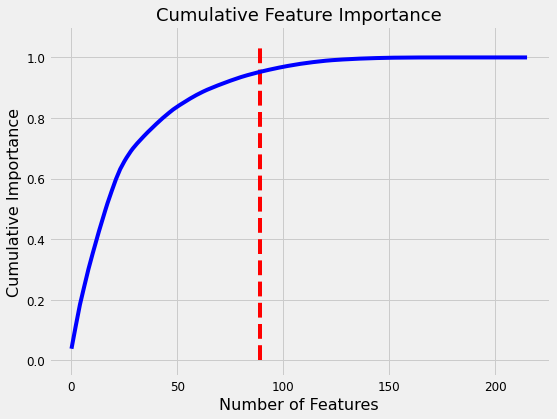

89 features required for 95% of cumulative importance.


In [545]:
_ = plot_feature_importances(gbm_fi, threshold=0.95)

**LightGBM with features selected through recursive feature elimination**

In [550]:
%%capture --no-display
submission, gbm_fi_selected, valid_scores_selected = model_gbm(train_selected, train_labels, test_selected, test_ids)

'Fold 1, Validation Score: 0.4406, Estimators Trained: 0'

'Fold 2, Validation Score: 0.40236, Estimators Trained: 0'

'Fold 3, Validation Score: 0.4012, Estimators Trained: 0'

'Fold 4, Validation Score: 0.38721, Estimators Trained: 0'

'Fold 5, Validation Score: 0.37723, Estimators Trained: 0'

'5 cross validation score: 0.40172 with std: 0.02155.'

In [551]:
model_results = model_results.append(pd.DataFrame({'model': ["GBM", "GBM_SEL"],
                                                  'cv_mean': [valid_scores.mean(), valid_scores_selected.mean()],
                                                  'cv_std': [valid_scores.std(), valid_scores_selected.std()]}),
                                    sort=True)

In [552]:
model_results

,cv_mean,cv_std,model
0,0.288425,0.040979,LSVC
1,0.184827,0.036955,GNB
2,0.312471,0.051020,MLP
3,0.319584,0.064362,LDA
4,0.273266,0.035011,RIDGE
5,0.339766,0.020474,knn-5
6,0.327754,0.042057,knn-10
7,0.307289,0.047118,knn-20
8,0.337073,0.041014,EXT
9,0.354806,0.035855,RF


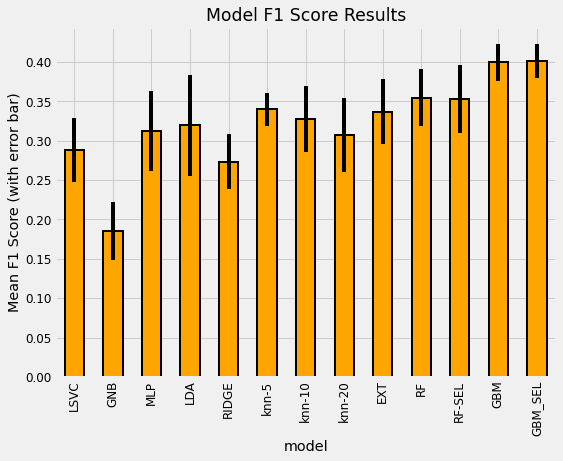

In [553]:
model_results.set_index('model', inplace=True)
model_results['cv_mean'].plot.bar(color='orange', figsize=(8, 6),
                                 yerr=list(model_results['cv_std']),
                                 edgecolor='k', linewidth=2)
plt.title('Model F1 Score Results')
plt.ylabel('Mean F1 Score (with error bar)')
model_results.reset_index(inplace=True)

In [556]:
%%capture
submission, gbm_fi, valid_scores = model_gbm(train_set, train_labels, test_set, test_ids, nfolds=10, return_preds=False)

In [557]:
submission.to_csv(result_path + 'gbm_10fold.csv', index=False)

In [558]:
%%capture
submission, gbm_fi_selected, valid_scores_selected = model_gbm(train_selected, train_labels, test_selected, test_ids, nfolds=10, return_preds=False)

In [559]:
submission.to_csv(result_path + 'gbm_10fold_selected.csv', index=False)

In [560]:
model_results = model_results.append(pd.DataFrame({'model': ["GBM_10Fold", "GBM_10Fold_SEL"],
                                                  'cv_mean': [valid_scores.mean(), valid_scores_selected.mean()],
                                                  'cv_std': [valid_scores.std(), valid_scores_selected.std()]}),
                                    sort=True)

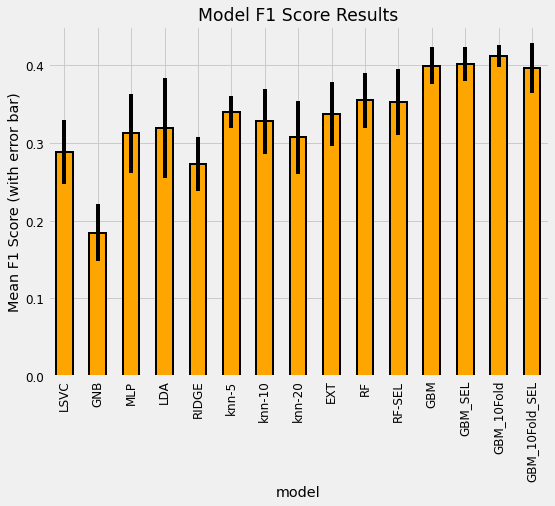

In [561]:
model_results.set_index('model', inplace=True)
model_results['cv_mean'].plot.bar(color='orange', figsize=(8, 6),
                                 yerr=list(model_results['cv_std']),
                                 edgecolor='k', linewidth=2)
plt.title('Model F1 Score Results')
plt.ylabel('Mean F1 Score (with error bar)')
model_results.reset_index(inplace=True)

In [562]:
print(f"There are {gbm_fi_selected[gbm_fi_selected['importance'] == 0].shape[0]} features with no importance.")

There are 14 features with no importance.


**Model Optimization**

**Model Tuning with Hyperopt (Bayesian Optimization)**

In [567]:
# manual search -> grid search -> randomized search -> bayesian optimization
from hyperopt import hp, tpe, Trials, fmin, STATUS_OK
from hyperopt.pyll.stochastic import sample

In [568]:
import csv
import ast
from timeit import default_timer as timer

In [603]:
def objective(hyperparameters, nfolds=5):
    """Return validation score from hyperparameters for LightGBM"""
    
    # Keep track of evals
    global ITERATION
    ITERATION += 1
    
    # Retrieve the subsample
    subsample = hyperparameters['boosting_type'].get('subsample', 1.0)
    subsample_freq = hyperparameters['boosting_type'].get('subsample_freq', 0)
    
    boosting_type = hyperparameters['boosting_type']['boosting_type']
    
    if boosting_type == 'dart':
        hyperparameters['drop_rate'] = hyperparameters['boosting_type']['drop_rate']
    
    # Subsample and subsample frequency to top level keys
    hyperparameters['subsample'] = subsample
    hyperparameters['subsample_freq'] = subsample_freq
    hyperparameters['boosting_type'] = boosting_type
    
    # Whether or not to use limit maximum depth
    if not hyperparameters['limit_max_depth']:
        hyperparameters['max_depth'] = -1
    
    # Make sure parameters that need to be integers are integers
    for parameter_name in ['max_depth', 'num_leaves', 'subsample_for_bin', 
                           'min_child_samples', 'subsample_freq']:
        hyperparameters[parameter_name] = int(hyperparameters[parameter_name])

    if 'n_estimators' in hyperparameters:
        del hyperparameters['n_estimators']
    
    # Using stratified kfold cross validation
    strkfold = StratifiedKFold(n_splits = nfolds, shuffle = True)
    
    # Convert to arrays for indexing
    features = np.array(train_selected)
    labels = np.array(train_labels).reshape((-1 ))
    
    valid_scores = []
    best_estimators = []
    run_times = []
    
    model = lgb.LGBMClassifier(**hyperparameters, class_weight = 'balanced',
                               n_jobs=-1, metric = 'None',
                               n_estimators=200)
    
    # Iterate through the folds
    for i, (train_indices, valid_indices) in enumerate(strkfold.split(features, labels)):
        
        # Training and validation data
        X_train = features[train_indices]
        X_valid = features[valid_indices]
        y_train = labels[train_indices]
        y_valid = labels[valid_indices]
        
        start = timer()
        # Train with early stopping
        model.fit(X_train, y_train, early_stopping_rounds = 100, 
                  eval_metric = macro_f1_score, 
                  eval_set = [(X_train, y_train), (X_valid, y_valid)],
                  eval_names = ['train', 'valid'],
                  verbose = 400)
        end = timer()
        # Record the validation fold score
        valid_scores.append(model.best_score_['valid']['macro_f1'])
        best_estimators.append(model.best_iteration_)
        
        run_times.append(end - start)
    
    score = np.mean(valid_scores)
    score_std = np.std(valid_scores)
    loss = 1 - score
    
    run_time = np.mean(run_times)
    run_time_std = np.std(run_times)
    
    estimators = int(np.mean(best_estimators))
    hyperparameters['n_estimators'] = estimators
    
    # Write to the csv file ('a' means append)
    of_connection = open(result_path + OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([loss, hyperparameters, ITERATION, run_time, score, score_std])
    of_connection.close()
    
    # Display progress
    if ITERATION % PROGRESS == 0:
        display(f'Iteration: {ITERATION}, Current Score: {round(score, 4)}.')
    
    return {'loss': loss, 'hyperparameters': hyperparameters, 'iteration': ITERATION,
            'time': run_time, 'time_std': run_time_std, 'status': STATUS_OK, 
            'score': score, 'score_std': score_std}

In [604]:
# Define the search space
space = {
    'boosting_type': hp.choice('boosting_type', 
                              [{'boosting_type': 'gbdt', 
                                'subsample': hp.uniform('gdbt_subsample', 0.5, 1),
                                'subsample_freq': hp.quniform('gbdt_subsample_freq', 1, 10, 1)}, 
                               {'boosting_type': 'dart', 
                                 'subsample': hp.uniform('dart_subsample', 0.5, 1),
                                 'subsample_freq': hp.quniform('dart_subsample_freq', 1, 10, 1),
                                 'drop_rate': hp.uniform('dart_drop_rate', 0.1, 0.5)},
                                {'boosting_type': 'goss',
                                 'subsample': 1.0,
                                 'subsample_freq': 0}]),
    'limit_max_depth': hp.choice('limit_max_depth', [True, False]),
    'max_depth': hp.quniform('max_depth', 1, 40, 1),
    'num_leaves': hp.quniform('num_leaves', 3, 50, 1),
    'learning_rate': hp.loguniform('learning_rate', 
                                   np.log(0.025), 
                                   np.log(0.25)),
    'subsample_for_bin': hp.quniform('subsample_for_bin', 2000, 100000, 2000),
    'min_child_samples': hp.quniform('min_child_samples', 5, 80, 5),
    'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
    'colsample_bytree': hp.uniform('colsample_by_tree', 0.5, 1.0)
}

In [605]:
sample(space)

{'boosting_type': {'boosting_type': 'dart',
  'drop_rate': 0.14138595316978658,
  'subsample': 0.628254269961198,
  'subsample_freq': 1.0},
 'colsample_bytree': 0.6278446488971787,
 'learning_rate': 0.04492190958944148,
 'limit_max_depth': False,
 'max_depth': 5.0,
 'min_child_samples': 65.0,
 'num_leaves': 17.0,
 'reg_alpha': 0.26393991051721377,
 'reg_lambda': 0.21778219410021793,
 'subsample_for_bin': 90000.0}

In [606]:
algo = tpe.suggest

In [607]:
trials = Trials()

OUT_FILE = 'optimization.csv'
of_connection = open(result_path + OUT_FILE, 'w')
writer = csv.writer(of_connection)

MAX_EVALS = 100
PROGRESS = 10
N_FOLDS = 5
ITERATION = 0

headers = ['loss', 'hyperparameters', 'iteration', 'runtime', 'score', 'std']
writer.writerow(headers)
of_connection.close()

In [608]:
%%capture --no-display
display("Running Optimization for {} Trials".format(MAX_EVALS))

best = fmin(fn=objective, space=space, algo=tpe.suggest, trials=trials, max_evals=MAX_EVALS)

'Running Optimization for 100 Trials'

'Iteration: 10, Current Score: 0.4231.'

'Iteration: 20, Current Score: 0.4203.'

'Iteration: 30, Current Score: 0.4376.'

'Iteration: 40, Current Score: 0.4132.'

'Iteration: 50, Current Score: 0.4286.'

'Iteration: 60, Current Score: 0.4047.'

'Iteration: 70, Current Score: 0.4142.'

'Iteration: 80, Current Score: 0.415.'

'Iteration: 90, Current Score: 0.4298.'

'Iteration: 100, Current Score: 0.4252.'

In [610]:
import json

with open(result_path + 'trials.json', 'w') as f:
    f.write(json.dumps(str(trials)))

**Using Optimized Model**

In [7]:
results = pd.read_csv(result_path + OUT_FILE).sort_values('loss', ascending=True)
results.head()

,loss,hyperparameters,iteration,runtime,score,std
82,0.554247,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",83,1.614250,0.445753,0.007811
23,0.554790,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",24,1.655801,0.445210,0.011681
60,0.556033,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",61,2.097886,0.443967,0.015614
96,0.557322,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",97,1.119603,0.442678,0.024271
92,0.558137,"{'boosting_type': 'gbdt', 'colsample_bytree': ...",93,1.449729,0.441863,0.021779


Text(0.5, 1.0, 'Optimization Scores')

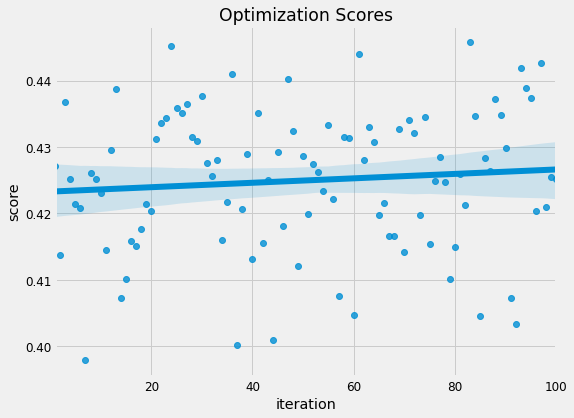

In [613]:
plt.figure(figsize=(8, 6))
sns.regplot('iteration', 'score', data=results)
plt.title("Optimization Scores")
# plt.xticks(list(range(1, results['iteration'].max() + 1, 3)))

In [617]:
best_hyp = ast.literal_eval(results.loc[0, 'hyperparameters'])
best_hyp

{'boosting_type': 'gbdt',
 'colsample_bytree': 0.724122029473264,
 'learning_rate': 0.04261740368441586,
 'limit_max_depth': False,
 'max_depth': -1,
 'min_child_samples': 20,
 'num_leaves': 29,
 'reg_alpha': 0.8845303473134388,
 'reg_lambda': 0.39003131343987274,
 'subsample_for_bin': 90000,
 'subsample': 0.8182859417118102,
 'subsample_freq': 7,
 'n_estimators': 97}

In [618]:
%%capture
submission, gbm_fi, valid_scores = model_gbm(train_selected, train_labels,
                                            test_selected, test_ids,
                                            nfolds=10, return_preds=False)

model_results = model_results.append(pd.DataFrame({'model': ["GBM_OPT_10Fold_SEL"],
                                                  'cv_mean': [valid_scores.mean()],
                                                  'cv_std': [valid_scores.std()]}),
                                    sort=True).sort_values('cv_mean', ascending=False)

In [619]:
%%capture
submission, gbm_fi, valid_scores = model_gbm(train_selected, train_labels,
                                            test_selected, test_ids,
                                            nfolds=10, return_preds=False)

model_results = model_results.append(pd.DataFrame({'model': ["GBM_OPT_10Fold"],
                                                  'cv_mean': [valid_scores.mean()],
                                                  'cv_std': [valid_scores.std()]}),
                                    sort=True).sort_values('cv_mean', ascending=False)

In [620]:
model_results.head()

,cv_mean,cv_std,model
13,0.411973,0.014326,GBM_10Fold
0,0.408560,0.039285,GBM_OPT_10Fold
0,0.406927,0.038931,GBM_OPT_10Fold_SEL
12,0.401717,0.021553,GBM_SEL
11,0.399627,0.023401,GBM


In [621]:
submission.to_csv(result_path + 'gbm_opt_10fold_selected.csv', index=False)

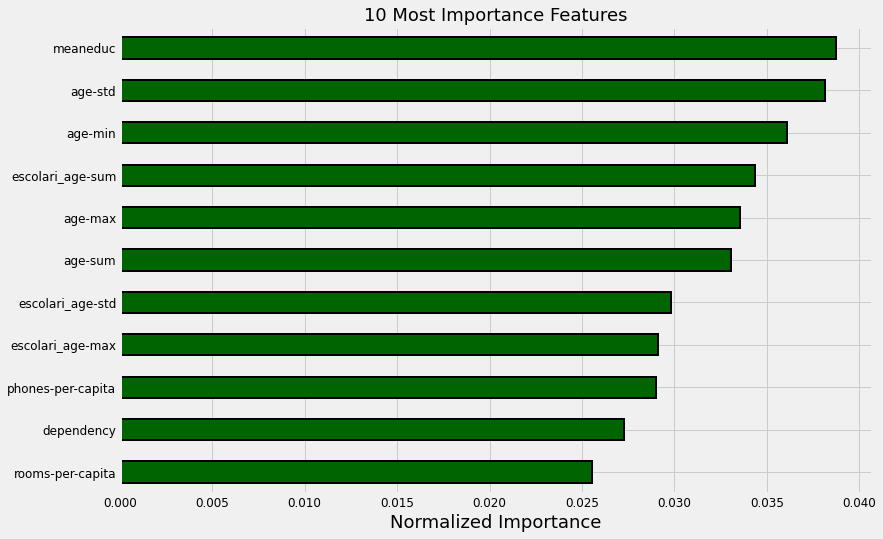

In [623]:
_ = plot_feature_importances(gbm_fi)

Text(0.5, 1.0, 'Predicted Label Distribution')

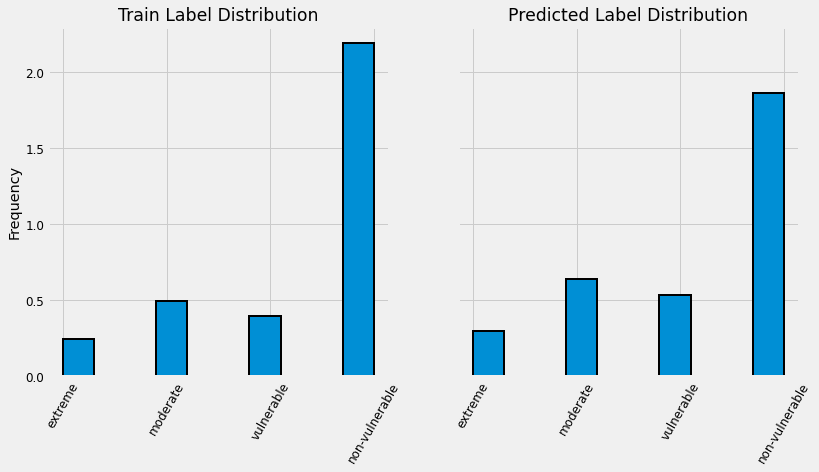

In [642]:
preds = submission_base.merge(submission, on='Id', how='left')
preds = pd.DataFrame(preds.groupby('idhogar')['Target'].mean())

fig, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 6))

# normed 대신 density
heads['Target'].sort_index().plot.hist(density=True,
                                      edgecolor='k',
                                      linewidth=2,
                                      ax=axes[0])

axes[0].set_xticks([1, 2, 3, 4])
axes[0].set_xticklabels(poverty_mapping.values(), rotation=60)
axes[0].set_title('Train Label Distribution')

preds['Target'].sort_index().plot.hist(density=True,
                                      edgecolor='k',
                                      linewidth=2,
                                      ax=axes[1])
axes[1].set_xticks([1, 2, 3, 4])
axes[1].set_xticklabels(poverty_mapping.values(), rotation=60)
plt.subplots_adjust()
plt.title('Predicted Label Distribution')

oversampling the minority class로 imbalanced classification problem 해결할 수 있음

**Validation**

In [643]:
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(train_selected,
                                                     train_labels,
                                                     test_size=1000,
                                                     random_state=10)

model = lgb.LGBMClassifier(**best_hyp,
                          class_weight='balanced',
                          random_state=10)
model.fit(X_train, y_train)

[LightGBM] [Warning] Unknown parameter: limit_max_depth


LGBMClassifier(class_weight='balanced', colsample_bytree=0.724122029473264,
               learning_rate=0.04261740368441586, limit_max_depth=False,
               n_estimators=97, num_leaves=29, random_state=10,
               reg_alpha=0.8845303473134388, reg_lambda=0.39003131343987274,
               subsample=0.8182859417118102, subsample_for_bin=90000,
               subsample_freq=7)

In [649]:
valid_preds = model.predict_proba(X_valid)
preds_df = pd.DataFrame(valid_preds, columns=[1, 2, 3, 4])

preds_df['prediction'] = preds_df[[1, 2, 3, 4]].idxmax(axis=1)
preds_df['confidence'] = preds_df[[1, 2, 3, 4]].max(axis=1)

preds_df.head()

,1,2,3,4,prediction,confidence
0,0.063854,0.029519,0.041246,0.865382,4,0.865382
1,0.018535,0.015515,0.008768,0.957183,4,0.957183
2,0.017281,0.065819,0.410702,0.506198,4,0.506198
3,0.156569,0.554071,0.217670,0.071690,2,0.554071
4,0.021549,0.198729,0.727210,0.052511,3,0.727210


In [651]:
print('F1 score:', round(f1_score(y_valid, preds_df['prediction'],
                                 average='macro'), 5))

F1 score: 0.42103


In [658]:
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                         normalize=False,
                         title='Confusion matrix',
                         cmap=plt.cm.Oranges):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print('Normalized confusion matrix')
    else:
        print('Confusion matrix, without normalization')
    
    print(cm)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, size=24)
    plt.colorbar(aspect=4)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, size=14)
    plt.yticks(tick_marks, classes, size=14)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2
    
    for i, j in itertools.product(range(cm.shape[0]),
                                 range(cm.shape[1])):
        
#         print(i, j)
        
        plt.text(j, i, format(cm[i, j], fmt), fontsize=20,
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")
    
    plt.grid(None)
    plt.tight_layout()
    plt.ylabel('True label', size=18)
    plt.xlabel('Predicted label', size=18)

Confusion matrix, without normalization
[[ 20  27  13  20]
 [ 18  56  30  35]
 [  8  29  32  44]
 [ 17  69  67 515]]


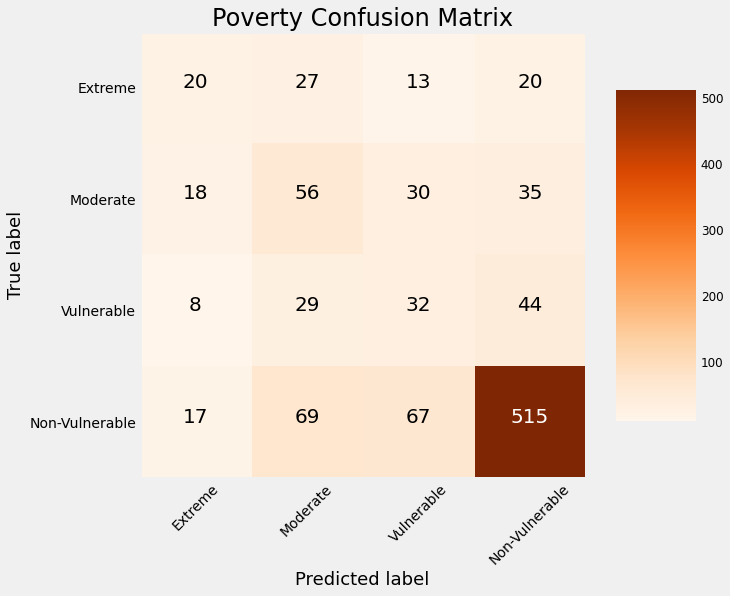

In [659]:
cm = confusion_matrix(y_valid, preds_df['prediction'])

# print(cm.shape)

plot_confusion_matrix(cm,
                     classes=['Extreme', 'Moderate', 'Vulnerable', 'Non-Vulnerable'],
                     title='Poverty Confusion Matrix')

Normalized confusion matrix
[[0.25       0.3375     0.1625     0.25      ]
 [0.1294964  0.4028777  0.21582734 0.25179856]
 [0.07079646 0.25663717 0.28318584 0.38938053]
 [0.0254491  0.10329341 0.1002994  0.77095808]]


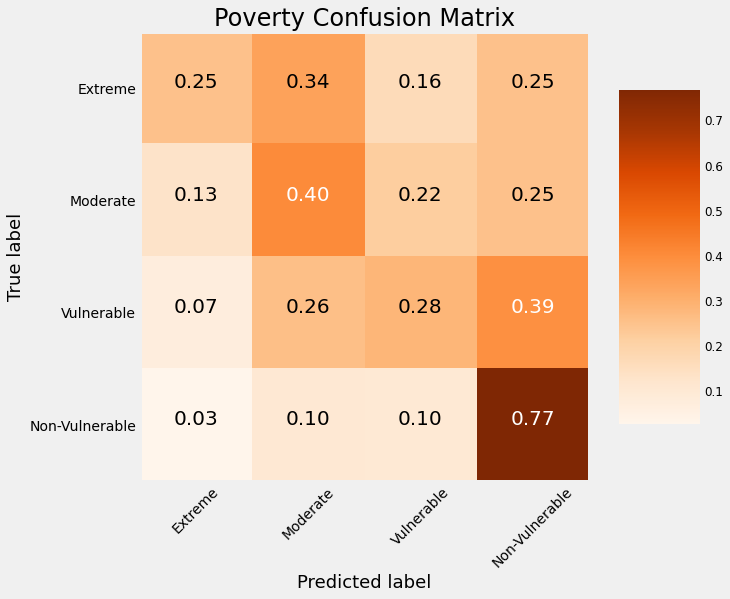

In [662]:
plot_confusion_matrix(cm, normalize=True,
                     classes=['Extreme', 'Moderate', 'Vulnerable', 'Non-Vulnerable'],
                     title='Poverty Confusion Matrix')

**Dimension Reduction (PCA, ICA, TSNE, UMAP)**

In [678]:
# pip install umap_learn
# import umap.umap_ as UMAP
from sklearn.decomposition import PCA, FastICA
from sklearn.manifold import TSNE

n_components = 3

# umap 작동 안 됨
# umap = UMAP(n_components=n_components)
pca = PCA(n_components=n_components)
ica = FastICA(n_components=n_components)
tsne = TSNE(n_components=n_components)

In [682]:
train_df = train_selected.copy()
test_df = test_selected.copy()

for method, name in zip([pca, ica, tsne], ['pca', 'ica', 'tsne']):
    if name == 'tsne':
        start = timer()
        reduction = method.fit_transform(train_selected)
        end = timer()
    else:
        start = timer()
        reduction = method.fit_transform(train_selected)
        end = timer()
        
        test_reduction = method.transform(test_selected)
        
        test_df['%s_c1' % name] = test_reduction[:, 0]
        test_df['%s_c2' % name] = test_reduction[:, 1]
        test_df['%s_c3' % name] = test_reduction[:, 2]
        
    train_df['%s_c1' % name] = reduction[:, 0]
    train_df['%s_c2' % name] = reduction[:, 1]
    train_df['%s_c3' % name] = reduction[:, 2]
        
    print(f'Method: {name} {round(end-start, 2)} seconds elapsed')

Method: pca 0.02 seconds elapsed
Method: ica 0.08 seconds elapsed
Method: tsne 16.57 seconds elapsed


In [688]:
from mpl_toolkits.mplot3d import Axes3D

def discrete_cmap(N, base_cmap=None):
    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    
    return base.from_list(cmap_name, color_list, N)

cmap = discrete_cmap(4, base_cmap=plt.cm.RdYlBu)

train_df['label'] = train_labels

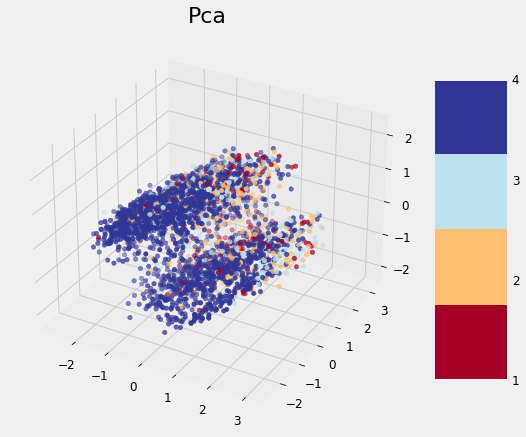

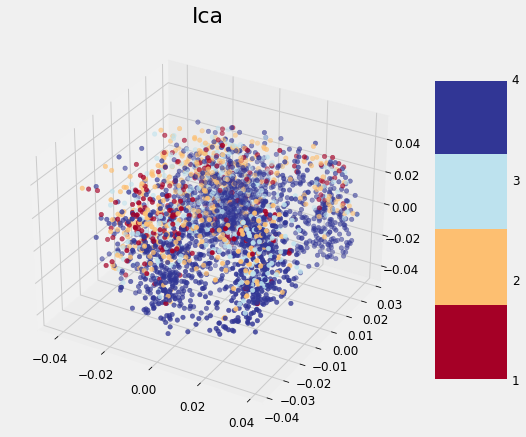

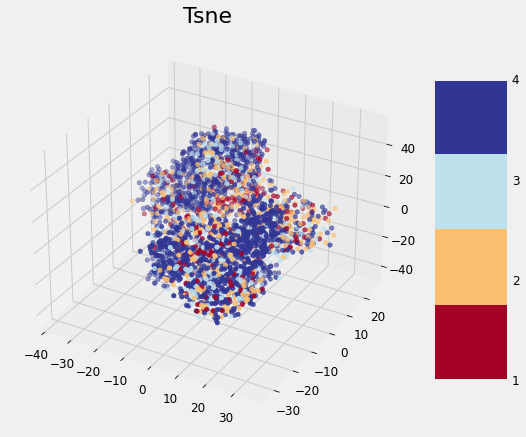

In [691]:
for method, name in zip([pca, ica, tsne], ['pca', 'ica', 'tsne']):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    p = ax.scatter(train_df['%s_c1' % name], train_df['%s_c2' % name], train_df['%s_c3' % name],
                  c=train_df['label'].astype(int), cmap=cmap)
    
    plt.title(f'{name.capitalize()}', size=22)
    fig.colorbar(p, aspect=4, ticks=[1, 2, 3, 4])

**PCA features add 하는 건 nonsense**

In [692]:
train_df, test_df = train_df.align(test_df, axis=1, join='inner')

In [695]:
%%capture



submission, gbm_fi, valid_scores = model_gbm(train_df,
                                            train_labels,
                                            test_df,
                                            test_ids,
                                            nfolds=10,
                                            hyp=best_hyp)

In [696]:
submission.to_csv(result_path + 'gbm_opt_10fold_dr.csv', index=False)

In [697]:
model_results = model_results.append(pd.DataFrame({'model': ["GBM_OPT_10Fold_DR"],
                                                  'cv_mean': [valid_scores.mean()],
                                                  'cv_std': [valid_scores.std()]}),
                                    sort=True)

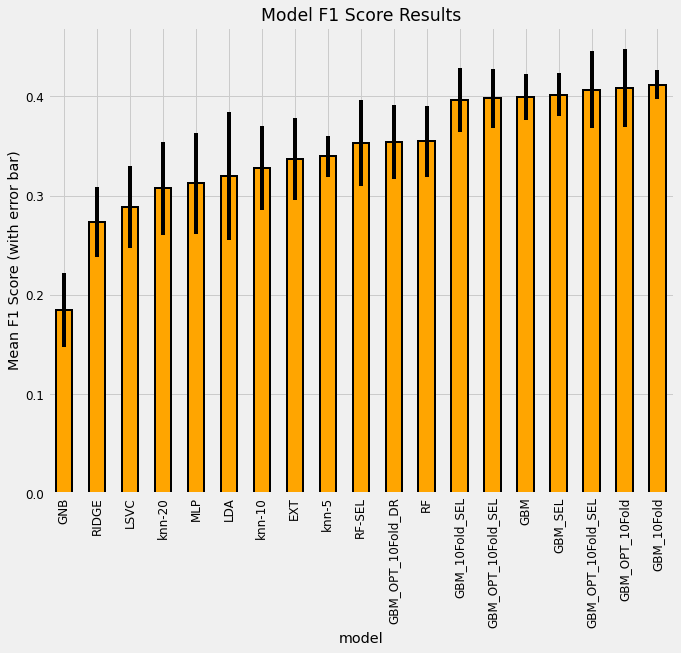

In [698]:
model_results = model_results.sort_values('cv_mean')
model_results.set_index('model', inplace = True)
model_results['cv_mean'].plot.bar(color = 'orange', figsize = (10, 8),
                                  edgecolor = 'k', linewidth = 2,
                                  yerr = list(model_results['cv_std']))
plt.title('Model F1 Score Results');
plt.ylabel('Mean F1 Score (with error bar)');
model_results.reset_index(inplace = True)

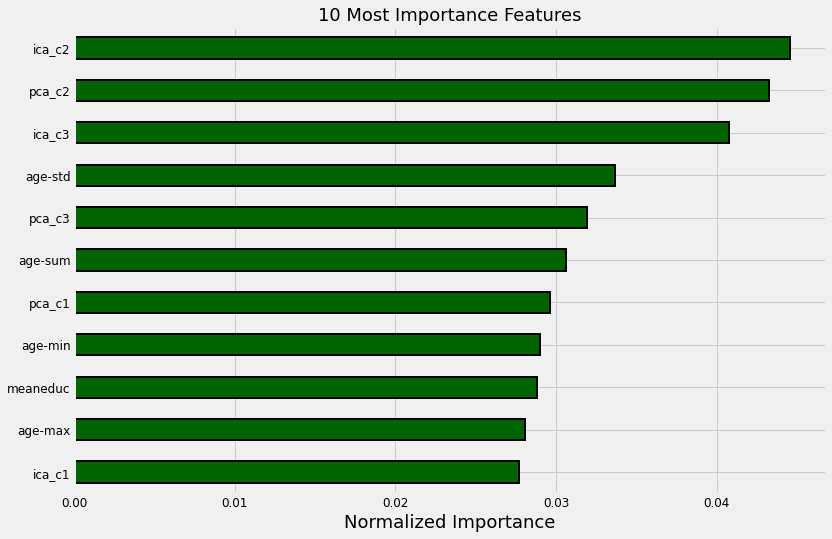

In [700]:
_ = plot_feature_importances(gbm_fi)

**Visualize Single Decision Tree**

In [701]:
model = RandomForestClassifier(max_depth=3, n_estimators=10)
model.fit(train_selected, train_labels)
estimator_limited = model.estimators_[5]
estimator_limited

DecisionTreeClassifier(max_depth=3, max_features='auto', random_state=15127158)

In [702]:
# brew install graphbiz
from sklearn.tree import export_graphviz

export_graphviz(estimator_limited, out_file=result_path+'tree_limited.dot',
               feature_names=train_selected.columns,
               class_names=['extreme', 'moderate', 'vulnerable', 'non-vulnerable'],
               rounded=True, proportion=False, precision=2, filled=True)

In [704]:
!dot -Tpng tree_limited.dot -o tree_limited.png

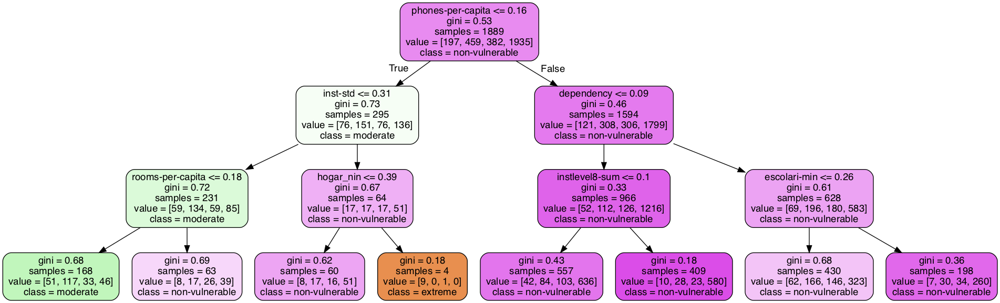

In [705]:
from IPython.display import Image
Image(filename='tree_limited.png')

In [708]:
model = RandomForestClassifier(max_depth=None, n_estimators=10)
model.fit(train_selected, train_labels)
estimator_nonlimited = model.estimators_[5]

export_graphviz(estimator_nonlimited,
               out_file=result_path+'tree_nonlimited.dot',
               feature_names=train_selected.columns,
               class_names=['extreme', 'moderate', 'vulnerable', 'non_vulnerable'],
               rounded=True,
               proportion=False,
               precision=2)

!dot -Tpng tree_nonlimited.dot -o tree_nonlimited.png -Gdpi=600

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.1042 to fit


In [709]:
Image(filename='tree_nonlimited.png')

**Kaggle submission**

In [160]:
# Notebook으로만 submit 가능한 competition이라 아래 방식 불가
# !kaggle competitions submit -c costa-rican-household-poverty-prediction -f submission_with_defined_param.csv -m "Random Search LGB"

100%|████████████████████████████████████████| 349k/349k [00:04<00:00, 80.8kB/s]
400 - Bad Request


In [157]:
# Notebook으로만 submit 가능한 competition이라 아래 방식 불가
# !kaggle competitions submit -c costa-rican-household-poverty-prediction -f submission_with_randomized_search.csv -m "Random Search LGB"

100%|████████████████████████████████████████| 349k/349k [00:04<00:00, 82.0kB/s]
400 - Bad Request
